In [1]:
# Librerias necesarias
import cv2
import math
import time
import warnings
import numpy as np
import pandas as pd
from scipy import stats
import scipy.stats as ss
from numpy import linalg as LA
import matplotlib.pyplot as plt
from skimage.transform import resize
from sklearn.linear_model import LinearRegression
from skimage.morphology import remove_small_holes, erosion, square
warnings.filterwarnings("ignore")

In [2]:
def sacar_imagen_canal(imagen, canal):
    matriz = []
    for i in range(len(imagen)):
        fila = []
        for j in range(len(imagen[0])):
            fila.append(np.uint8(imagen[i][j][canal]))
        fila = np.array(fila)
        matriz.append(fila)
    matriz = np.array(matriz)
    return matriz

In [3]:
def union_imagen(imagen_1, imagen_2, imagen_3):
    matriz = []
    for i in range(len(imagen_1)):
        fila = []
        for j in range(len(imagen_1[0])):
            fila.append([imagen_1[i][j], imagen_2[i][j], imagen_3[i][j]])
        matriz.append(fila)
    return matriz

In [4]:
def transformacion_imagen(imagen, ruido):
    nueva_imagen = []
    for i in range(len(imagen)):
        lista = []
        for j in range(len(imagen[0])):
            R = max(min(int(imagen[i][j][0] + ruido[i][j][0]),255), 0)
            G = max(min(int(imagen[i][j][1] + ruido[i][j][1]),255), 0)
            B = max(min(int(imagen[i][j][2] + ruido[i][j][2]),255), 0)
            lista.append([R,G,B])
        nueva_imagen.append(lista)
    return nueva_imagen

In [5]:
def maxima_intensidad_imagen(imagen):
    lista = []
    for i in range(len(imagen)):
        for j in range(len(imagen[0])):
            lista.append(imagen[i][j][0])
            lista.append(imagen[i][j][1])
            lista.append(imagen[i][j][2])
    maximo = max(lista)
    return maximo

In [6]:
def muestreo_normal(porcentaje, imagen):
    maxima_intensidad = maxima_intensidad_imagen(imagen)
    sigma = porcentaje*maxima_intensidad
    total_datos = len(imagen)*len(imagen[0])
    muestreo_1 = np.random.normal(0, sigma, total_datos)
    muestreo_2 = np.random.normal(0, sigma, total_datos)
    muestreo_3 = np.random.normal(0, sigma, total_datos)
    ruido = []
    alto = len(imagen)
    ancho = len(imagen[0])
    for i in range(alto):
        lista = []
        for j in range(ancho):
            lista.append([muestreo_1[j + i*ancho], muestreo_2[j + i*ancho], muestreo_3[j + i*ancho]])
        ruido.append(lista)
    return ruido

In [7]:
def imagen_para_aplicar_filtro(imagen):
    alto = len(imagen)
    ancho = len(imagen[0])
    matriz = []
    for i in range(alto+4):
        lista = []
        for j in range(ancho+4):
            if i == 0 or i == 1 or i == alto + 3 or i == alto + 2 or j == 0 or j == 1 or j == ancho + 3 or j == ancho + 2:
                lista.append([0, 0, 0])
            else:
                lista.append([imagen[i-2][j-2][0], imagen[i-2][j-2][1], imagen[i-2][j-2][2]]) 
        matriz.append(lista)
    return matriz

In [8]:
def filtro_media(imagen):
    imagen_filtro = imagen_para_aplicar_filtro(imagen)
    alto = len(imagen)
    ancho = len(imagen[0])
    matriz = []
    for i in range(alto):
        lista = []
        for j in range(ancho):
            lista_R = []
            lista_R.append(imagen_filtro[i+1][j+1][0])
            lista_R.append(imagen_filtro[i+1][j+2][0])
            lista_R.append(imagen_filtro[i+1][j+3][0])
            lista_R.append(imagen_filtro[i+2][j+1][0])
            lista_R.append(imagen_filtro[i+2][j+2][0])
            lista_R.append(imagen_filtro[i+2][j+3][0])
            lista_R.append(imagen_filtro[i+3][j+1][0])
            lista_R.append(imagen_filtro[i+3][j+2][0])
            lista_R.append(imagen_filtro[i+3][j+3][0])
            lista_G = []
            lista_G.append(imagen_filtro[i+1][j+1][1])
            lista_G.append(imagen_filtro[i+1][j+2][1])
            lista_G.append(imagen_filtro[i+1][j+3][1])
            lista_G.append(imagen_filtro[i+2][j+1][1])
            lista_G.append(imagen_filtro[i+2][j+2][1])
            lista_G.append(imagen_filtro[i+2][j+3][1])
            lista_G.append(imagen_filtro[i+3][j+1][1])
            lista_G.append(imagen_filtro[i+3][j+2][1])
            lista_G.append(imagen_filtro[i+3][j+3][1])
            lista_B = []
            lista_B.append(imagen_filtro[i+1][j+1][2])
            lista_B.append(imagen_filtro[i+1][j+2][2])
            lista_B.append(imagen_filtro[i+1][j+3][2])
            lista_B.append(imagen_filtro[i+2][j+1][2])
            lista_B.append(imagen_filtro[i+2][j+2][2])
            lista_B.append(imagen_filtro[i+2][j+3][2])
            lista_B.append(imagen_filtro[i+3][j+1][2])
            lista_B.append(imagen_filtro[i+3][j+2][2])
            lista_B.append(imagen_filtro[i+3][j+3][2])
            lista.append([int(np.mean(lista_R)), int(np.mean(lista_G)), int(np.mean(lista_B))])
        matriz.append(lista)    
    return matriz

In [9]:
def filtro_mediana(imagen):
    imagen_filtro = imagen_para_aplicar_filtro(imagen)
    alto = len(imagen)
    ancho = len(imagen[0])
    matriz = []
    for i in range(alto):
        lista = []
        for j in range(ancho):
            lista_R = []
            lista_R.append(imagen_filtro[i+1][j+1][0])
            lista_R.append(imagen_filtro[i+1][j+2][0])
            lista_R.append(imagen_filtro[i+1][j+3][0])
            lista_R.append(imagen_filtro[i+2][j+1][0])
            lista_R.append(imagen_filtro[i+2][j+2][0])
            lista_R.append(imagen_filtro[i+2][j+3][0])
            lista_R.append(imagen_filtro[i+3][j+1][0])
            lista_R.append(imagen_filtro[i+3][j+2][0])
            lista_R.append(imagen_filtro[i+3][j+3][0])
            lista_G = []
            lista_G.append(imagen_filtro[i+1][j+1][1])
            lista_G.append(imagen_filtro[i+1][j+2][1])
            lista_G.append(imagen_filtro[i+1][j+3][1])
            lista_G.append(imagen_filtro[i+2][j+1][1])
            lista_G.append(imagen_filtro[i+2][j+2][1])
            lista_G.append(imagen_filtro[i+2][j+3][1])
            lista_G.append(imagen_filtro[i+3][j+1][1])
            lista_G.append(imagen_filtro[i+3][j+2][1])
            lista_G.append(imagen_filtro[i+3][j+3][1])
            lista_B = []
            lista_B.append(imagen_filtro[i+1][j+1][2])
            lista_B.append(imagen_filtro[i+1][j+2][2])
            lista_B.append(imagen_filtro[i+1][j+3][2])
            lista_B.append(imagen_filtro[i+2][j+1][2])
            lista_B.append(imagen_filtro[i+2][j+2][2])
            lista_B.append(imagen_filtro[i+2][j+3][2])
            lista_B.append(imagen_filtro[i+3][j+1][2])
            lista_B.append(imagen_filtro[i+3][j+2][2])
            lista_B.append(imagen_filtro[i+3][j+3][2])
            lista.append([int(np.median(lista_R)), int(np.median(lista_G)), int(np.median(lista_B))])
        matriz.append(lista)    
    return matriz

In [10]:
def filtro_gamma(imagen, gamma):
    nueva_imagen = []
    for i in range(len(imagen)):
        fila = []
        for j in range(len(imagen[0])):
            lista = []
            lista.append(min(max(int(255*((imagen[i][j][0]/255)**gamma)),0), 255))
            lista.append(min(max(int(255*((imagen[i][j][1]/255)**gamma)),0), 255))
            lista.append(min(max(int(255*((imagen[i][j][2]/255)**gamma)),0), 255))
            fila.append(lista)
        nueva_imagen.append(fila)
    return nueva_imagen

In [11]:
def pasa_altos_gaussiano(espectro, D_0):
    largo = len(espectro)
    ancho = len(espectro[0])
    vertice_central = np.array([int(largo/2), int(ancho/2)])
    
    nuevo_espectro = []
    
    for i in range(largo):
        fila = []
        for j in range(ancho):
            vertice = np.array([i+1, j+1])
            distancia = np.linalg.norm(vertice-vertice_central)
            exponente = - (distancia**2)/(2*(D_0**2))
            factor = 1 - math.exp(exponente)
            nuevo_elemento = factor*espectro[i][j]
            fila.append(nuevo_elemento)         
        nuevo_espectro.append(fila)

    return nuevo_espectro

In [12]:
def binarizacion_imagen(imagen, tolerancia):
    nueva_imagen = []
    for i in range(len(imagen)):
        fila = []
        for j in range(len(imagen[0])):
            cantidad = np.linalg.norm(imagen[i][j])
            if cantidad > tolerancia:
                fila.append([255, 255, 255])
            else:
                fila.append([0, 0, 0])
        nueva_imagen.append(fila)
    return nueva_imagen

In [13]:
def identificar_objeto(altura_1, altura_2, ancho_1, ancho_2, imagen_binaria):
    resultados = []
    for i in range(altura_1, altura_2 + 1):
        lista = []
        for j in range(ancho_1, ancho_2 + 1):    
            if imagen_binaria[i][j][0] == 255:
                lista.append(j)
        resultados.append([i, [min(lista), max(lista)]])
    
    lista_1 = []
    lista_2 = []
    for k in resultados:
        lista_1.append(k[0])
        lista_2.append(k[1])
        
    return [lista_1, lista_2]

In [14]:
def sacar_objeto(imagen, listado):
    nueva_imagen = []
    for i in range(len(imagen)):
        fila = []
        for j in range(len(imagen[0])):
            if i in listado[0]:
                indice = listado[0].index(i)
                if listado[1][indice][0] <= j <= listado[1][indice][1]:
                    fila.append([255, 255, 255])
                else:
                    fila.append(imagen[i][j])
            else:
                fila.append(imagen[i][j])
        nueva_imagen.append(fila)
    return nueva_imagen

In [15]:
def solo_objeto(imagen, listado):
    nueva_imagen = []
    for i in range(len(imagen)):
        fila = []
        for j in range(len(imagen[0])):
            if i in listado[0]:
                indice = listado[0].index(i)
                if listado[1][indice][0] <= j <= listado[1][indice][1]:
                    fila.append(imagen[i][j])
                else:
                    fila.append([255, 255, 255])
            else:
                fila.append([255, 255, 255])
        nueva_imagen.append(fila)
    return nueva_imagen

In [16]:
def imagen_numerica(imagen):
    nueva_imagen = []
    puntos = []
    for i in range(len(imagen)):
        fila = []
        for j in range(len(imagen[0])):
            if imagen[i][j] == [255, 255, 255]:
                fila.append([255, 255, 255])
                puntos.append([i, j])
            else:
                fila.append([0, 0, 0])
        nueva_imagen.append(fila)
    
    return [nueva_imagen, puntos]

In [17]:
def sacar_puntos_candidatos(matriz_numerica, radio, puntos):
    
    nuevos_puntos = []
    
    lista_1 = []
    lista_2 = []

    for k in puntos:
        lista_1.append(k[0])
        lista_2.append(k[1])

    minimo_ancho = max(min(lista_1) - radio, 0)
    maximo_ancho = min(max(lista_1) + radio, len(matriz_numerica))
    minimo_largo = max(min(lista_2) - radio, 0)
    maximo_largo = min(max(lista_2) + radio, len(matriz_numerica[0]))
    
    for i in range(minimo_ancho, maximo_ancho+1):
        for j in range(minimo_largo, maximo_largo+1):
            if matriz_numerica[i][j] != [255, 255, 255]:
                nuevos_puntos.append([i, j])
    
    return [nuevos_puntos]

In [18]:
def elementos_mas_cercanos(puntos_1, puntos_2, radio):
    lista_final = []
    for i in range(len(puntos_1)):
        if (i % 1000) == 0:
            print(i)
        k = puntos_1[i]
        lista_distancia = []
        candidatos = []
        for h in puntos_2:
            lista_distancia.append(((h[0] - k[0])**2 + (h[1]-k[1])**2)**(1/2))
            candidatos.append(h)
        minima_distancia = min(lista_distancia)
        if minima_distancia <= radio:
            indice = lista_distancia.index(minima_distancia)
            lista_final.append([k, candidatos[indice]])
    return lista_final

In [19]:
def sacar_matriz_anillo(matriz_numeros, elementos_gris):
    nueva_matriz = []
    for i in range(len(matriz_numeros)):
        fila = []
        for j in range(len(matriz_numeros[0])):
            if [i, j] in elementos_gris:
                fila.append([122, 122, 122])
            else:
                fila.append(matriz_numeros[i][j])
        nueva_matriz.append(fila)
    return nueva_matriz

In [20]:
def sacar_elementos_mas_anillo(imagen_trabajar, matriz_anillo):
    nueva_imagen = []
    for i in range(len(imagen_trabajar)):
        fila = []
        for j in range(len(imagen_trabajar[0])):
            if matriz_anillo[i][j] == [122, 122, 122] or matriz_anillo[i][j] == [255, 255, 255]:
                fila.append(imagen_trabajar[i][j])
            else:
                fila.append([255, 255, 255])
        nueva_imagen.append(fila)
    return nueva_imagen

In [21]:
def imagen_espejo(imagen_trabajar, puntos_asociados, puntos_dentro):
    puntos_ya_asignados = []
    nueva_imagen = []
    for i in range(len(imagen_trabajar)):
        fila = []
        for j in range(len(imagen_trabajar[0])):
            if [i, j] in puntos_dentro:
                indice = puntos_dentro.index([i, j])
                agrega = [0, 0, 0]
                for k in range(len(puntos_asociados[indice][1])):
                    x_1 = puntos_asociados[indice][1][k][0]
                    x_2 = puntos_asociados[indice][1][k][1]
                    agrega[0] = agrega[0] + imagen_trabajar[x_1][x_2][0]
                    agrega[1] = agrega[1] + imagen_trabajar[x_1][x_2][1]
                    agrega[2] = agrega[2] + imagen_trabajar[x_1][x_2][2]
                
                agrega[0] = int(agrega[0]/len(puntos_asociados[indice][1]))
                agrega[1] = int(agrega[1]/len(puntos_asociados[indice][1]))
                agrega[2] = int(agrega[2]/len(puntos_asociados[indice][1]))
                fila.append(agrega)
                
                puntos_ya_asignados.append([i, j])
            
            else:
                fila.append(imagen_trabajar[i][j])
        
        nueva_imagen.append(fila)
    return [nueva_imagen, puntos_ya_asignados]

In [22]:
def espejo_final(espejo, puntos_no_asignados_mas_cerca_1, puntos_no_asignados_mas_cerca_2):
    nueva_imagen = []
    for i in range(len(espejo)):
        fila = []
        for j in range(len(espejo[0])):
            if [i, j] in puntos_no_asignados_mas_cerca_1:
                indice = puntos_no_asignados_mas_cerca_1.index([i, j])
                x_1 = puntos_no_asignados_mas_cerca_2[indice][0]
                x_2 = puntos_no_asignados_mas_cerca_2[indice][0]
                fila.append(espejo[x_1][x_2])
            else:
                fila.append(espejo[i][j])
        
        nueva_imagen.append(fila)
    return nueva_imagen

In [23]:
def filtro_media_zona(imagen, alto_1, alto_2, ancho_1, ancho_2):
    imagen_filtro = imagen_para_aplicar_filtro(imagen)
    alto = len(imagen)
    ancho = len(imagen[0])
    matriz = []
    for i in range(alto):
        lista = []
        for j in range(ancho):
            if alto_1 <= i + 2 <= alto_2 and ancho_1 <= j + 2 <= ancho_2:
                lista_R = []
                lista_R.append(imagen_filtro[i+1][j+1][0])
                lista_R.append(imagen_filtro[i+1][j+2][0])
                lista_R.append(imagen_filtro[i+1][j+3][0])
                lista_R.append(imagen_filtro[i+2][j+1][0])
                lista_R.append(imagen_filtro[i+2][j+2][0])
                lista_R.append(imagen_filtro[i+2][j+3][0])
                lista_R.append(imagen_filtro[i+3][j+1][0])
                lista_R.append(imagen_filtro[i+3][j+2][0])
                lista_R.append(imagen_filtro[i+3][j+3][0])
                lista_G = []
                lista_G.append(imagen_filtro[i+1][j+1][1])
                lista_G.append(imagen_filtro[i+1][j+2][1])
                lista_G.append(imagen_filtro[i+1][j+3][1])
                lista_G.append(imagen_filtro[i+2][j+1][1])
                lista_G.append(imagen_filtro[i+2][j+2][1])
                lista_G.append(imagen_filtro[i+2][j+3][1])
                lista_G.append(imagen_filtro[i+3][j+1][1])
                lista_G.append(imagen_filtro[i+3][j+2][1])
                lista_G.append(imagen_filtro[i+3][j+3][1])
                lista_B = []
                lista_B.append(imagen_filtro[i+1][j+1][2])
                lista_B.append(imagen_filtro[i+1][j+2][2])
                lista_B.append(imagen_filtro[i+1][j+3][2])
                lista_B.append(imagen_filtro[i+2][j+1][2])
                lista_B.append(imagen_filtro[i+2][j+2][2])
                lista_B.append(imagen_filtro[i+2][j+3][2])
                lista_B.append(imagen_filtro[i+3][j+1][2])
                lista_B.append(imagen_filtro[i+3][j+2][2])
                lista_B.append(imagen_filtro[i+3][j+3][2])
                lista.append([int(np.mean(lista_R)), int(np.mean(lista_G)), int(np.mean(lista_B))])
            else:
                lista.append(imagen_filtro[i+2][j+2])
        matriz.append(lista)    
    return matriz

In [24]:
def filtro_mediana_zona(imagen, alto_1, alto_2, ancho_1, ancho_2):
    imagen_filtro = imagen_para_aplicar_filtro(imagen)
    alto = len(imagen)
    ancho = len(imagen[0])
    matriz = []
    for i in range(alto):
        lista = []
        for j in range(ancho):
            if alto_1 <= i + 2 <= alto_2 and ancho_1 <= j + 2 <= ancho_2:
                lista_R = []
                lista_R.append(imagen_filtro[i+1][j+1][0])
                lista_R.append(imagen_filtro[i+1][j+2][0])
                lista_R.append(imagen_filtro[i+1][j+3][0])
                lista_R.append(imagen_filtro[i+2][j+1][0])
                lista_R.append(imagen_filtro[i+2][j+2][0])
                lista_R.append(imagen_filtro[i+2][j+3][0])
                lista_R.append(imagen_filtro[i+3][j+1][0])
                lista_R.append(imagen_filtro[i+3][j+2][0])
                lista_R.append(imagen_filtro[i+3][j+3][0])
                lista_G = []
                lista_G.append(imagen_filtro[i+1][j+1][1])
                lista_G.append(imagen_filtro[i+1][j+2][1])
                lista_G.append(imagen_filtro[i+1][j+3][1])
                lista_G.append(imagen_filtro[i+2][j+1][1])
                lista_G.append(imagen_filtro[i+2][j+2][1])
                lista_G.append(imagen_filtro[i+2][j+3][1])
                lista_G.append(imagen_filtro[i+3][j+1][1])
                lista_G.append(imagen_filtro[i+3][j+2][1])
                lista_G.append(imagen_filtro[i+3][j+3][1])
                lista_B = []
                lista_B.append(imagen_filtro[i+1][j+1][2])
                lista_B.append(imagen_filtro[i+1][j+2][2])
                lista_B.append(imagen_filtro[i+1][j+3][2])
                lista_B.append(imagen_filtro[i+2][j+1][2])
                lista_B.append(imagen_filtro[i+2][j+2][2])
                lista_B.append(imagen_filtro[i+2][j+3][2])
                lista_B.append(imagen_filtro[i+3][j+1][2])
                lista_B.append(imagen_filtro[i+3][j+2][2])
                lista_B.append(imagen_filtro[i+3][j+3][2])
                lista.append([int(np.median(lista_R)), int(np.median(lista_G)), int(np.median(lista_B))])
            else:
                lista.append(imagen_filtro[i+2][j+2])
        matriz.append(lista)    
    return matriz

In [25]:
def imagen_definitiva(imagen_final, puntos_residuales):
    nueva_imagen = []
    for i in range(len(imagen_final)):
        fila = []
        for j in range(len(imagen_final[0])):
            if [i, j] in puntos_residuales:
                fila.append([255, 0, 0])
            else:
                fila.append(imagen_final[i][j])
        nueva_imagen.append(fila)
    return nueva_imagen

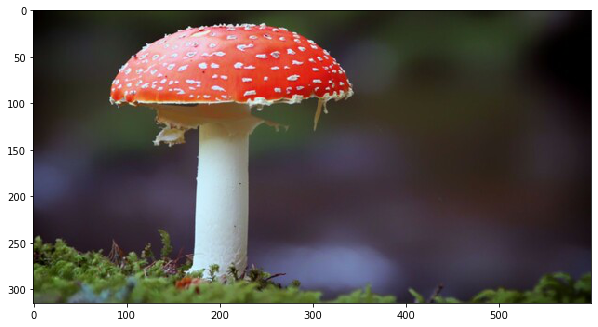

In [26]:
# CARGAR IMAGEN

fig, ax = plt.subplots(figsize=(10,10))
nombre = 'hongos.jpg'
imagen = plt.imread(nombre)
plt.imshow(imagen)

In [27]:
principio_hongo = time.time()

In [28]:
gamma = 0.8
imagen_bajo_contraste = filtro_gamma(imagen, gamma)
porcentaje = 0.05
ruido = muestreo_normal(porcentaje, imagen_bajo_contraste)
imagen_con_ruido_bajo = transformacion_imagen(imagen_bajo_contraste, ruido)

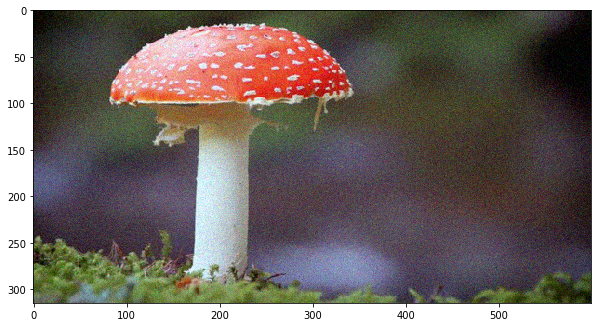

In [29]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_con_ruido_bajo)

In [30]:
filtro_media_imagen = filtro_media(imagen_con_ruido_bajo)
gamma = 1.4
imagen_trabajar = filtro_gamma(filtro_media_imagen, gamma)

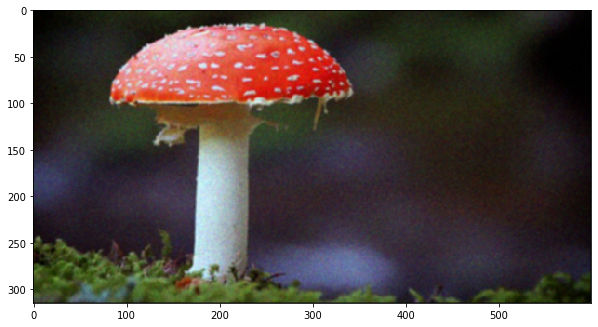

In [31]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_trabajar)

In [32]:
imagen_trabajar_rojo = sacar_imagen_canal(imagen_trabajar, 0)
imagen_trabajar_verde = sacar_imagen_canal(imagen_trabajar, 1)
imagen_trabajar_azul = sacar_imagen_canal(imagen_trabajar, 2)

f_rojo = np.fft.fft2(imagen_trabajar_rojo)
f_verde = np.fft.fft2(imagen_trabajar_verde)
f_azul = np.fft.fft2(imagen_trabajar_azul)

fshift_rojo = np.fft.fftshift(f_rojo)
fshift_verde = np.fft.fftshift(f_verde)
fshift_azul = np.fft.fftshift(f_azul)

magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo))
magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde))
magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul))

In [33]:
D_0 = 30

fshift_rojo_modificado = pasa_altos_gaussiano(fshift_rojo, D_0)
fshift_verde_modificado = pasa_altos_gaussiano(fshift_verde, D_0)
fshift_azul_modificado = pasa_altos_gaussiano(fshift_azul, D_0)

nueva_magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo_modificado))
nueva_magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde_modificado))
nueva_magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul_modificado))

In [34]:
f_ishift_rojo_modificado = np.fft.ifftshift(fshift_rojo_modificado)
img_back_rojo_modificado = np.fft.ifft2(f_ishift_rojo_modificado)
img_back_rojo_modificado = np.uint8(np.abs(img_back_rojo_modificado))

f_ishift_verde_modificado = np.fft.ifftshift(fshift_verde_modificado)
img_back_verde_modificado = np.fft.ifft2(f_ishift_verde_modificado)
img_back_verde_modificado = np.uint8(np.abs(img_back_verde_modificado))

f_ishift_azul_modificado = np.fft.ifftshift(fshift_azul_modificado)
img_back_azul_modificado = np.fft.ifft2(f_ishift_azul_modificado)
img_back_azul_modificado = np.uint8(np.abs(img_back_azul_modificado))

imagen_filtro_gaussiano = union_imagen(img_back_rojo_modificado, img_back_verde_modificado, img_back_azul_modificado)

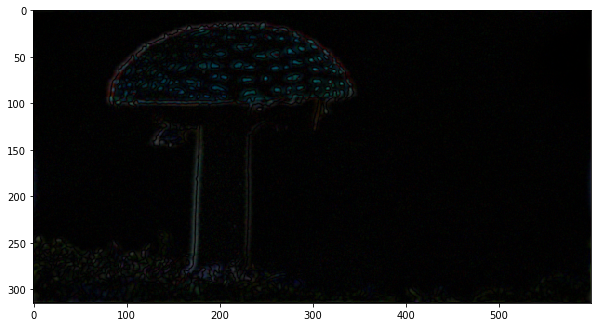

In [35]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_filtro_gaussiano)

In [36]:
tolerancia = 18
imagen_binaria = binarizacion_imagen(imagen_filtro_gaussiano, tolerancia)

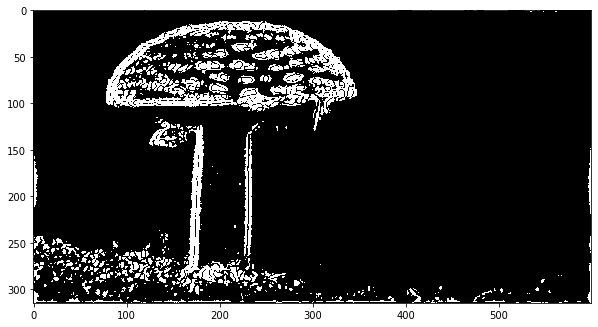

In [37]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_binaria)

In [38]:
iteraciones = 1
tolerancia = 18

for i in range(iteraciones):
    start = time.time()
    imagen_binaria = filtro_media(imagen_binaria)
    imagen_binaria = binarizacion_imagen(imagen_binaria, tolerancia)
    end = time.time()
    print("En la iteracion {0} se demoro {1}".format(i, end-start))

En la iteracion 0 se demoro 13.817424535751343


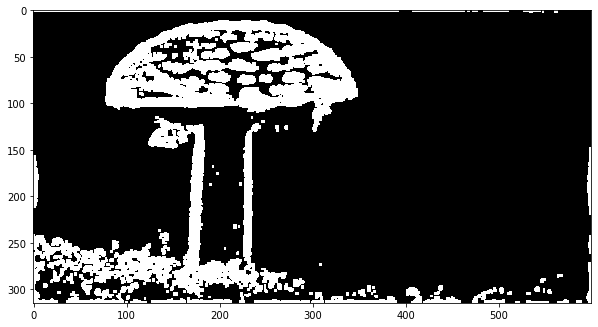

In [39]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_binaria)

In [40]:
identificacion = identificar_objeto(11, 105, 50, 400, imagen_binaria)
imagen_sacada = sacar_objeto(imagen_trabajar, identificacion)

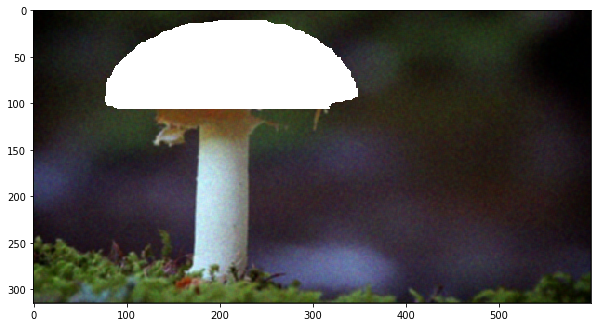

In [41]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_sacada)

In [42]:
imagen_sola = solo_objeto(imagen_trabajar, identificacion)

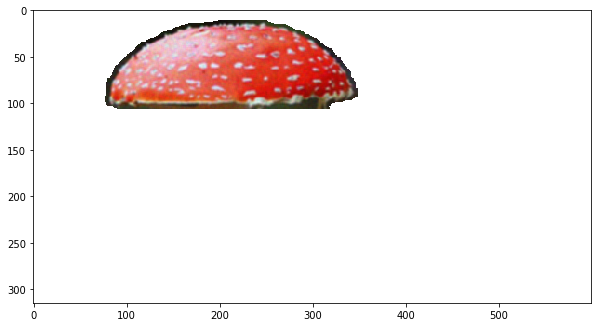

In [43]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_sola)

In [44]:
matriz_numeros = imagen_numerica(imagen_sacada)[0]
puntos = imagen_numerica(imagen_sacada)[1]  #Puntos son todos los puntos en blanco

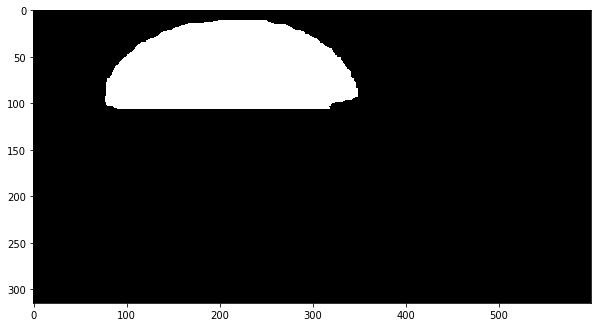

In [45]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(matriz_numeros)

In [46]:
radio = 20

# nuevos_puntos[0] son los puntos alrededor de la figura
nuevos_puntos  = sacar_puntos_candidatos(matriz_numeros, radio, puntos)

In [47]:
puntos_1 = nuevos_puntos[0]   #Puntos alrededor de la figura
puntos_2 = puntos   #Puntos dentro de la figura

In [48]:
start = time.time()

elementos_cercanos = elementos_mas_cercanos(puntos_1, puntos_2, radio)

end = time.time()

print(end-start)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
691.3611452579498


In [49]:
puntos_borde = []

for i in range(len(elementos_cercanos)):
    puntos_borde.append(elementos_cercanos[i][1])

In [50]:
puntos_espejo = []

for i in range(len(elementos_cercanos)):
   
    d_1 = elementos_cercanos[i][1][0] - elementos_cercanos[i][0][0]
    x_1 = d_1 + elementos_cercanos[i][1][0]
    
    d_2 = elementos_cercanos[i][1][1] - elementos_cercanos[i][0][1]
    x_2 = d_2 + elementos_cercanos[i][1][1]
    
    puntos_espejo.append([elementos_cercanos[i][0], [x_1, x_2]])

In [51]:
puntos_asignados = []

for i in range(len(puntos_espejo)):
    puntos_asignados.append(puntos_espejo[i][1])

In [52]:
puntos_asociados = []

for i in range(len(puntos_asignados)):
    lista = []
    for k in range(len(puntos_espejo)):
        if puntos_espejo[k][1] == puntos_asignados[i]:
            lista.append(puntos_espejo[k][0])
    puntos_asociados.append([puntos_asignados[i], lista])

In [53]:
elementos_gris = []

for i in range(len(elementos_cercanos)):
    elementos_gris.append(elementos_cercanos[i][0])

In [54]:
matriz_anillo = sacar_matriz_anillo(matriz_numeros, elementos_gris)

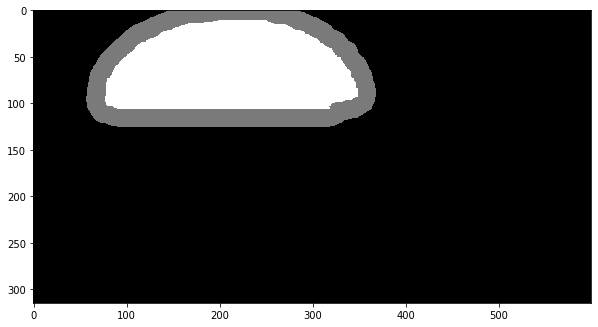

In [55]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(matriz_anillo)

In [56]:
imagen_mas_anillo = sacar_elementos_mas_anillo(imagen_trabajar, matriz_anillo)

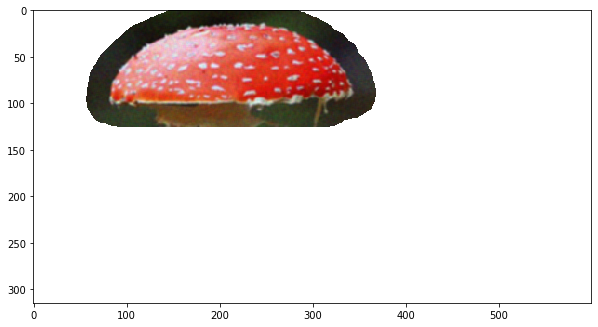

In [57]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_mas_anillo)

In [58]:
puntos_dentro = []

for i in range(len(puntos_asociados)):
    puntos_dentro.append(puntos_asociados[i][0])

In [59]:
output = imagen_espejo(imagen_sacada, puntos_asociados, puntos_dentro)
espejo = output[0]
puntos_ya_asignados = output[1]

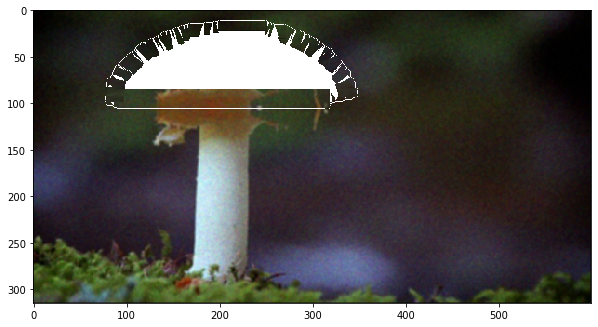

In [60]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(espejo)

In [61]:
anillo_interior = []
nuevo_radio = radio

for i in range(len(puntos_borde)):
    if i % 1000 == 0:
        print(i)
    for j in range(len(puntos)):
        distancia = ((puntos_borde[i][0] - puntos[j][0])**2 + (puntos_borde[i][1] - puntos[j][1])**2)**(1/2)
        if distancia <= nuevo_radio:
            if not(puntos[j] in anillo_interior):
                anillo_interior.append(puntos[j])

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000


In [62]:
puntos_aun_no_asignados = []

for i in range(len(anillo_interior)):
    if not(anillo_interior[i] in puntos_ya_asignados):
        puntos_aun_no_asignados.append(anillo_interior[i])

In [63]:
puntos_no_asignados_mas_cerca_1 = []
puntos_no_asignados_mas_cerca_2 = []

for i in range(len(puntos_aun_no_asignados)):
    lista_posibles = []
    lista_distancia = []
    for j in range(len(puntos_ya_asignados)):
        lista_posibles.append(puntos_ya_asignados[j])
        parte_1 = (puntos_ya_asignados[j][0] - puntos_aun_no_asignados[i][0])**2
        parte_2 = (puntos_ya_asignados[j][1] - puntos_aun_no_asignados[i][1])**2
        distancia = (parte_1 + parte_2)**(1/2)
        lista_distancia.append(distancia)
    minima_distancia = min(lista_distancia)
    indice = lista_distancia.index(minima_distancia)
    mas_cerca = lista_posibles[indice]
    puntos_no_asignados_mas_cerca_1.append(puntos_aun_no_asignados[i])
    puntos_no_asignados_mas_cerca_2.append(mas_cerca)

In [64]:
resultado_final = espejo_final(espejo, puntos_no_asignados_mas_cerca_1, puntos_no_asignados_mas_cerca_2)

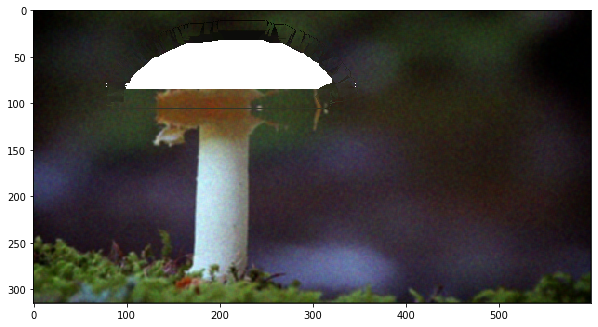

In [65]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(resultado_final)

In [66]:
imagen_final = filtro_mediana_zona(resultado_final, 0, 125, 50, 350)

n_iteraciones_mediana = 7
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 0, 125, 50, 350)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 1
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 0, 125, 50, 350)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 4.112937927246094
En la iteracion 2 nos demoramos 4.386453151702881
En la iteracion 3 nos demoramos 4.814432621002197
En la iteracion 4 nos demoramos 4.108828544616699
En la iteracion 5 nos demoramos 4.409281015396118
En la iteracion 6 nos demoramos 4.89264178276062
En la iteracion 7 nos demoramos 5.172060489654541
En la iteracion 1 nos demoramos 2.0810234546661377


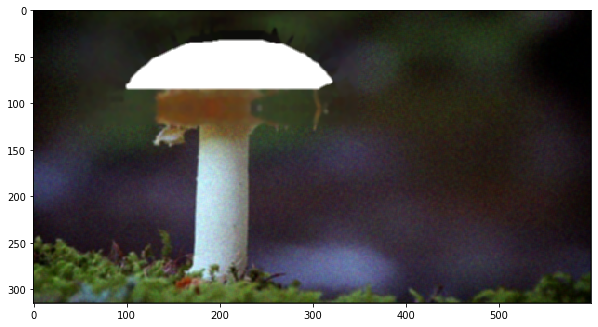

In [67]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_final)

In [68]:
puntos_residuales = []

for k in puntos:
    if not(k in anillo_interior):
        puntos_residuales.append(k)

In [69]:
start = time.time()

imagen_def = imagen_definitiva(imagen_final, puntos_residuales)

end = time.time()

print(end-start)

69.49657106399536


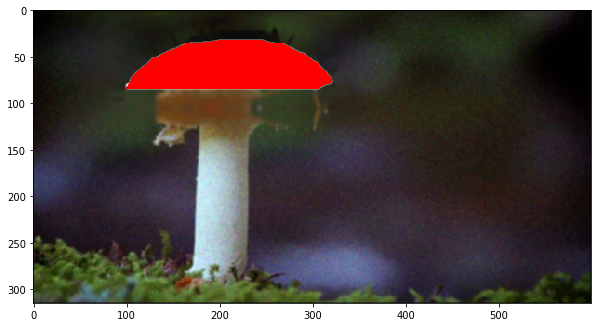

In [70]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_def)

In [71]:
##### EMPEZANDO A HACER INPAINTING

probando_imagen = []

for i in range(len(imagen_final)):
    lista = []
    for j in range(len(imagen_final[0])):
        lista.append(imagen_final[i][j])
    probando_imagen.append(lista)

In [72]:
# Separar los puntos residuales por nivel

primera_componente = []

for k in puntos_residuales:
    primera_componente.append(k[0])
    
primera_componente = set(primera_componente)

primera_componente = list(primera_componente)

puntos_residuales_nivel = []

for k in primera_componente:
    lista_nivel = []
    for i in puntos_residuales:
        if i[0] == k:
            lista_nivel.append(i[1])
    puntos_residuales_nivel.append(lista_nivel)
    
intervalos_nivel = []

for k in puntos_residuales_nivel:
    intervalos_nivel.append([min(k), max(k)])
    
niveles_maximo = []
niveles_minimo = []

for h in intervalos_nivel:
    niveles_maximo.append(h[1])
    niveles_minimo.append(h[0])

In [73]:
limite_1 = 150
limite_2 = 150

minimo = min(niveles_minimo)
maximo = max(niveles_maximo)

In [74]:
for k in puntos_residuales:
    indice = primera_componente.index(k[0])
    if limite_2 <= k[1] <= maximo:
        distancia = maximo - k[1]
        nuevo_indice = distancia + maximo
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]
    elif minimo <= k[1] <= limite_1:
        distancia = k[1] - minimo
        nuevo_indice = minimo - distancia
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]

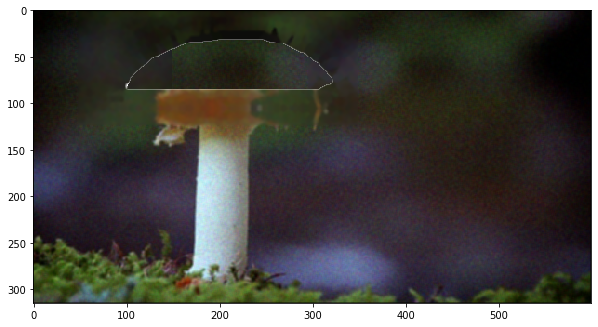

In [75]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(probando_imagen)

In [76]:
ultimate_imagen = filtro_mediana_zona(probando_imagen, 25, 125, 88, 325)

n_iteraciones_mediana = 10
for i in range(n_iteraciones_mediana):
    start = time.time()
    ultimate_imagen = filtro_mediana_zona(ultimate_imagen, 25, 125, 88, 325)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 2
for j in range(n_iteraciones_media):
    start = time.time()
    ultimate_imagen = filtro_media_zona(ultimate_imagen, 25, 125, 88, 325)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 3.04274845123291
En la iteracion 2 nos demoramos 2.806880474090576
En la iteracion 3 nos demoramos 3.707165002822876
En la iteracion 4 nos demoramos 2.227095365524292
En la iteracion 5 nos demoramos 3.267707109451294
En la iteracion 6 nos demoramos 2.8261494636535645
En la iteracion 7 nos demoramos 3.1384167671203613
En la iteracion 8 nos demoramos 3.1928114891052246
En la iteracion 9 nos demoramos 3.043426752090454
En la iteracion 10 nos demoramos 3.0317435264587402
En la iteracion 1 nos demoramos 2.3989174365997314
En la iteracion 2 nos demoramos 1.5524804592132568


In [77]:
finally_imagen = []
pixeles_finales = []
tol = 30

for i in range(len(ultimate_imagen)):
    lista = []
    for j in range(len(ultimate_imagen[i])):
        if np.linalg.norm(ultimate_imagen[i][j]) <= tol and 150 <= j <= 300 and 0 <= i <= 50:
            lista.append([255, 255, 255])
            pixeles_finales.append([i,j])
        else:
            lista.append(ultimate_imagen[i][j])
    finally_imagen.append(lista)

In [78]:
for k in pixeles_finales:
    distancia = 35 - k[0]
    nuevo_indice = 35 + distancia
    finally_imagen[k[0]][k[1]] = finally_imagen[nuevo_indice][k[1]]

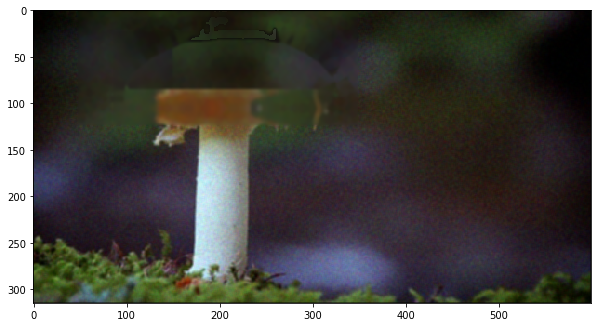

In [79]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(finally_imagen)

In [80]:
ultimate_imagen = filtro_mediana_zona(finally_imagen, 0, 125, 88, 325)

n_iteraciones_mediana = 10
for i in range(n_iteraciones_mediana):
    start = time.time()
    ultimate_imagen = filtro_mediana_zona(ultimate_imagen, 0, 125, 88, 325)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 10
for j in range(n_iteraciones_media):
    start = time.time()
    ultimate_imagen = filtro_media_zona(ultimate_imagen, 0, 125, 88, 325)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 3.8095555305480957
En la iteracion 2 nos demoramos 4.44225001335144
En la iteracion 3 nos demoramos 3.4878697395324707
En la iteracion 4 nos demoramos 4.284708499908447
En la iteracion 5 nos demoramos 5.324842214584351
En la iteracion 6 nos demoramos 4.941256761550903
En la iteracion 7 nos demoramos 3.5850374698638916
En la iteracion 8 nos demoramos 5.4678332805633545
En la iteracion 9 nos demoramos 3.0600497722625732
En la iteracion 10 nos demoramos 4.625028371810913
En la iteracion 1 nos demoramos 2.9514613151550293
En la iteracion 2 nos demoramos 2.686028480529785
En la iteracion 3 nos demoramos 1.385082483291626
En la iteracion 4 nos demoramos 2.8328709602355957
En la iteracion 5 nos demoramos 2.4489481449127197
En la iteracion 6 nos demoramos 1.412034511566162
En la iteracion 7 nos demoramos 2.814504384994507
En la iteracion 8 nos demoramos 3.0681090354919434
En la iteracion 9 nos demoramos 2.0220282077789307
En la iteracion 10 nos demoramos 1.61198

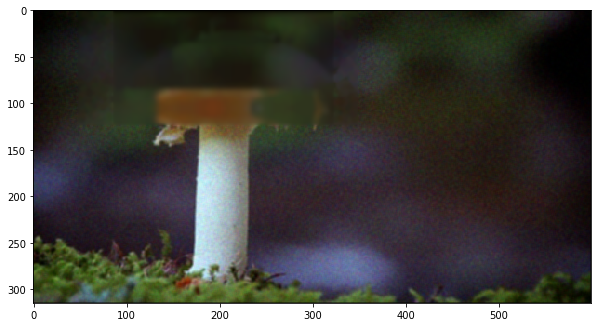

In [81]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(ultimate_imagen)

In [82]:
fin_hongo = time.time()

In [83]:
print("El tiempo en imagen de hongo es: ", fin_hongo - principio_hongo)

El tiempo en imagen de hongo es:  4070.484054327011


In [84]:
#-----------------------------------------

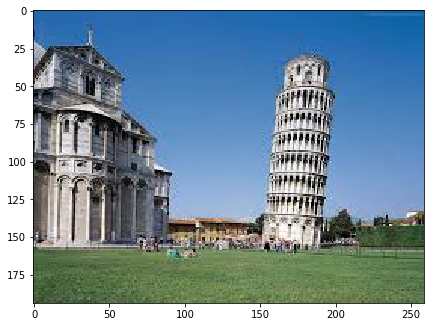

In [85]:
# CARGAR IMAGEN

fig, ax = plt.subplots(figsize=(7,7))
nombre = 'torrepisa.jpg'
imagen = plt.imread(nombre)
plt.imshow(imagen)

In [86]:
principio_pisa = time.time()

In [87]:
gamma = 0.8
imagen_bajo_contraste = filtro_gamma(imagen, gamma)
porcentaje = 0.05
ruido = muestreo_normal(porcentaje, imagen_bajo_contraste)
imagen_con_ruido_bajo = transformacion_imagen(imagen_bajo_contraste, ruido)

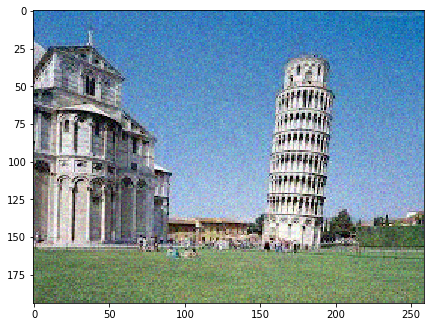

In [88]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_con_ruido_bajo)

In [89]:
filtro_media_imagen = filtro_media(imagen_con_ruido_bajo)
gamma = 1.4
imagen_trabajar = filtro_gamma(filtro_media_imagen, gamma)

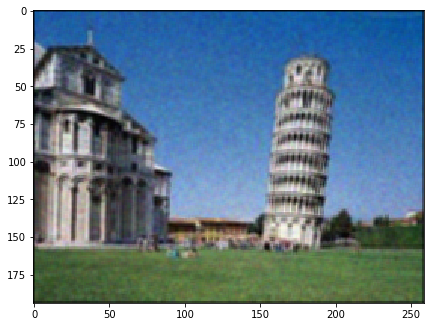

In [90]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_trabajar)

In [91]:
imagen_trabajar_rojo = sacar_imagen_canal(imagen_trabajar, 0)
imagen_trabajar_verde = sacar_imagen_canal(imagen_trabajar, 1)
imagen_trabajar_azul = sacar_imagen_canal(imagen_trabajar, 2)

f_rojo = np.fft.fft2(imagen_trabajar_rojo)
f_verde = np.fft.fft2(imagen_trabajar_verde)
f_azul = np.fft.fft2(imagen_trabajar_azul)

fshift_rojo = np.fft.fftshift(f_rojo)
fshift_verde = np.fft.fftshift(f_verde)
fshift_azul = np.fft.fftshift(f_azul)

magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo))
magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde))
magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul))

In [92]:
D_0 = 30

fshift_rojo_modificado = pasa_altos_gaussiano(fshift_rojo, D_0)
fshift_verde_modificado = pasa_altos_gaussiano(fshift_verde, D_0)
fshift_azul_modificado = pasa_altos_gaussiano(fshift_azul, D_0)

nueva_magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo_modificado))
nueva_magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde_modificado))
nueva_magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul_modificado))

In [93]:
f_ishift_rojo_modificado = np.fft.ifftshift(fshift_rojo_modificado)
img_back_rojo_modificado = np.fft.ifft2(f_ishift_rojo_modificado)
img_back_rojo_modificado = np.uint8(np.abs(img_back_rojo_modificado))

f_ishift_verde_modificado = np.fft.ifftshift(fshift_verde_modificado)
img_back_verde_modificado = np.fft.ifft2(f_ishift_verde_modificado)
img_back_verde_modificado = np.uint8(np.abs(img_back_verde_modificado))

f_ishift_azul_modificado = np.fft.ifftshift(fshift_azul_modificado)
img_back_azul_modificado = np.fft.ifft2(f_ishift_azul_modificado)
img_back_azul_modificado = np.uint8(np.abs(img_back_azul_modificado))

imagen_filtro_gaussiano = union_imagen(img_back_rojo_modificado, img_back_verde_modificado, img_back_azul_modificado)

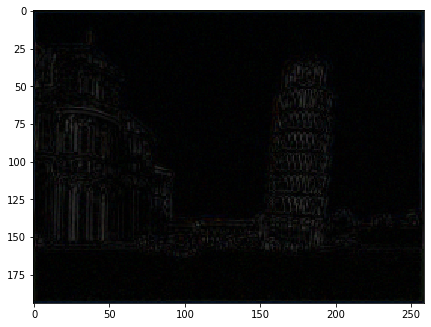

In [94]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_filtro_gaussiano)

In [95]:
tolerancia = 18
imagen_binaria = binarizacion_imagen(imagen_filtro_gaussiano, tolerancia)

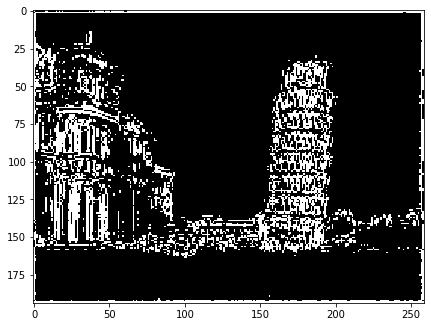

In [96]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_binaria)

In [97]:
iteraciones = 1
tolerancia = 18

for i in range(iteraciones):
    start = time.time()
    imagen_binaria = filtro_media(imagen_binaria)
    imagen_binaria = binarizacion_imagen(imagen_binaria, tolerancia)
    end = time.time()
    print("En la iteracion {0} se demoro {1}".format(i, end-start))

En la iteracion 0 se demoro 3.931030750274658


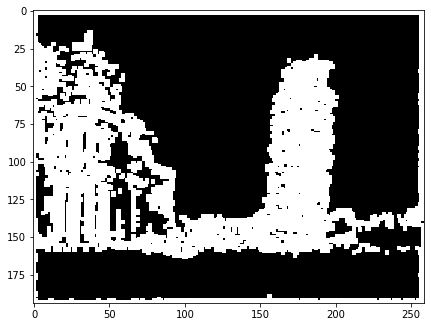

In [98]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_binaria)

In [99]:
identificacion = identificar_objeto(30, 150, 150, 200, imagen_binaria)
imagen_sacada = sacar_objeto(imagen_trabajar, identificacion)

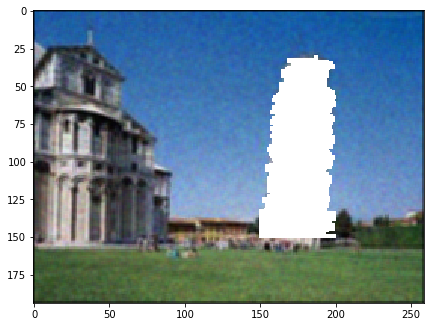

In [100]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_sacada)

In [101]:
imagen_sola = solo_objeto(imagen_trabajar, identificacion)

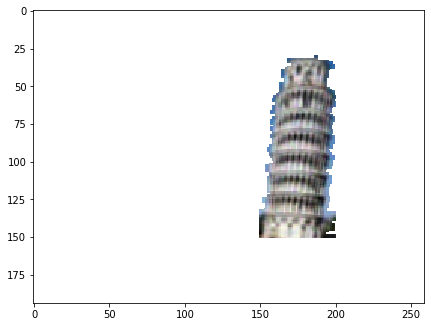

In [102]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_sola)

In [103]:
matriz_numeros = imagen_numerica(imagen_sacada)[0]
puntos = imagen_numerica(imagen_sacada)[1]  #Puntos son todos los puntos en blanco

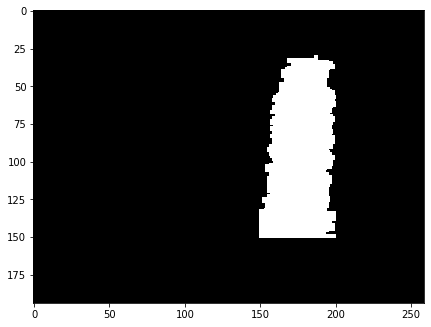

In [104]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(matriz_numeros)

In [105]:
# nuevos_puntos[0] son los puntos alrededor de la figura
nuevos_puntos  = sacar_puntos_candidatos(matriz_numeros, 4, puntos)

In [106]:
puntos_1 = nuevos_puntos[0]   #Puntos alrededor de la figura
puntos_2 = puntos   #Puntos dentro de la figura

In [107]:
start = time.time()

elementos_cercanos = elementos_mas_cercanos(puntos_1, puntos_2, 4)

end = time.time()

print(end-start)

0
1000
2000
25.676635265350342


In [108]:
puntos_borde = []

for i in range(len(elementos_cercanos)):
    puntos_borde.append(elementos_cercanos[i][1])

In [109]:
puntos_espejo = []

for i in range(len(elementos_cercanos)):
   
    d_1 = elementos_cercanos[i][1][0] - elementos_cercanos[i][0][0]
    x_1 = d_1 + elementos_cercanos[i][1][0]
    
    d_2 = elementos_cercanos[i][1][1] - elementos_cercanos[i][0][1]
    x_2 = d_2 + elementos_cercanos[i][1][1]
    
    puntos_espejo.append([elementos_cercanos[i][0], [x_1, x_2]])

In [110]:
puntos_asignados = []

for i in range(len(puntos_espejo)):
    puntos_asignados.append(puntos_espejo[i][1])

In [111]:
puntos_asociados = []

for i in range(len(puntos_asignados)):
    lista = []
    for k in range(len(puntos_espejo)):
        if puntos_espejo[k][1] == puntos_asignados[i]:
            lista.append(puntos_espejo[k][0])
    puntos_asociados.append([puntos_asignados[i], lista])

In [112]:
elementos_gris = []

for i in range(len(elementos_cercanos)):
    elementos_gris.append(elementos_cercanos[i][0])

In [113]:
matriz_anillo = sacar_matriz_anillo(matriz_numeros, elementos_gris)

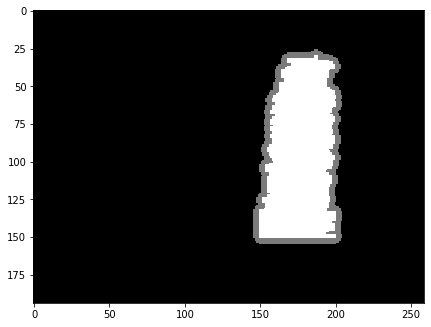

In [114]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(matriz_anillo)

In [115]:
imagen_mas_anillo = sacar_elementos_mas_anillo(imagen_trabajar, matriz_anillo)

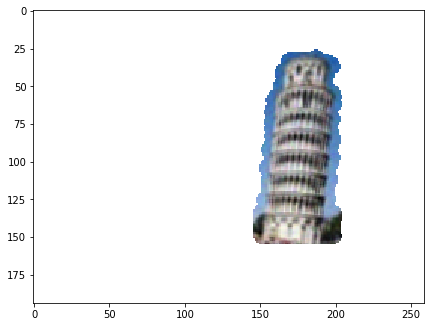

In [116]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_mas_anillo)

In [117]:
puntos_dentro = []

for i in range(len(puntos_asociados)):
    puntos_dentro.append(puntos_asociados[i][0])

In [118]:
output = imagen_espejo(imagen_sacada, puntos_asociados, puntos_dentro)
espejo = output[0]
puntos_ya_asignados = output[1]

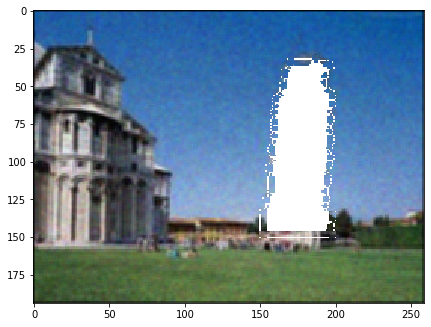

In [119]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(espejo)

In [120]:
anillo_interior = []
nuevo_radio = 10

for i in range(len(puntos_borde)):
    if i % 1000 == 0:
        print(i)
    for j in range(len(puntos)):
        distancia = ((puntos_borde[i][0] - puntos[j][0])**2 + (puntos_borde[i][1] - puntos[j][1])**2)**(1/2)
        if distancia <= nuevo_radio:
            if not(puntos[j] in anillo_interior):
                anillo_interior.append(puntos[j])

0
1000


In [121]:
puntos_aun_no_asignados = []

for i in range(len(anillo_interior)):
    if not(anillo_interior[i] in puntos_ya_asignados):
        puntos_aun_no_asignados.append(anillo_interior[i])

In [122]:
puntos_no_asignados_mas_cerca_1 = []
puntos_no_asignados_mas_cerca_2 = []

for i in range(len(puntos_aun_no_asignados)):
    lista_posibles = []
    lista_distancia = []
    for j in range(len(puntos_ya_asignados)):
        lista_posibles.append(puntos_ya_asignados[j])
        parte_1 = (puntos_ya_asignados[j][0] - puntos_aun_no_asignados[i][0])**2
        parte_2 = (puntos_ya_asignados[j][1] - puntos_aun_no_asignados[i][1])**2
        distancia = (parte_1 + parte_2)**(1/2)
        lista_distancia.append(distancia)
    minima_distancia = min(lista_distancia)
    indice = lista_distancia.index(minima_distancia)
    mas_cerca = lista_posibles[indice]
    puntos_no_asignados_mas_cerca_1.append(puntos_aun_no_asignados[i])
    puntos_no_asignados_mas_cerca_2.append(mas_cerca)

In [123]:
resultado_final = espejo_final(espejo, puntos_no_asignados_mas_cerca_1, puntos_no_asignados_mas_cerca_2)

In [124]:
imagen_final = filtro_mediana_zona(espejo, 25, 150, 160, 210)

n_iteraciones_mediana = 1
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 25, 160, 150, 210)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 1
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 25, 160, 150, 210)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 1.2547266483306885
En la iteracion 1 nos demoramos 0.8312816619873047


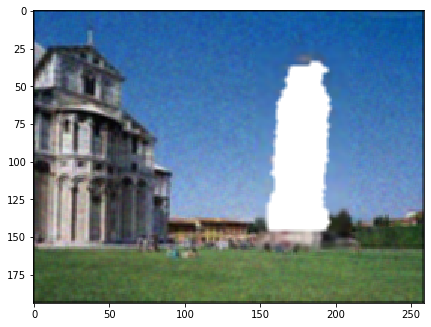

In [125]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_final)

In [126]:
puntos_residuales = []
tol = 400

nueva_imagen = []

for i in range(len(imagen_final)):
    filas = []
    for j in range(len(imagen_final[0])):
        if np.linalg.norm(imagen_final[i][j]) >= tol and 125 <= j <= 225:
            puntos_residuales.append([i, j])
            filas.append([255, 0, 0])
        else:
            filas.append(imagen_final[i][j])
    nueva_imagen.append(filas)

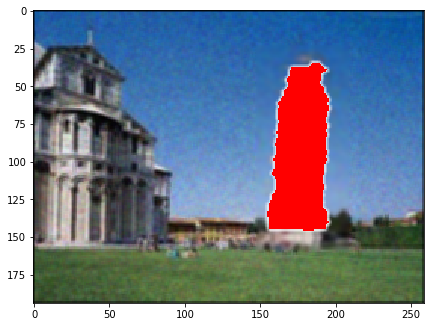

In [127]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(nueva_imagen)

In [128]:
##### EMPEZANDO A HACER INPAINTING

probando_imagen = []

for i in range(len(imagen_final)):
    lista = []
    for j in range(len(imagen_final[0])):
        lista.append(imagen_final[i][j])
    probando_imagen.append(lista)

In [129]:
# Separar los puntos residuales por nivel

primera_componente = []

for k in puntos_residuales:
    primera_componente.append(k[0])
    
primera_componente = set(primera_componente)

primera_componente = list(primera_componente)

puntos_residuales_nivel = []

for k in primera_componente:
    lista_nivel = []
    for i in puntos_residuales:
        if i[0] == k:
            lista_nivel.append(i[1])
    puntos_residuales_nivel.append(lista_nivel)
    
intervalos_nivel = []

for k in puntos_residuales_nivel:
    intervalos_nivel.append([min(k), max(k)])
    
niveles_maximo = []
niveles_minimo = []

for h in intervalos_nivel:
    niveles_maximo.append(h[1])
    niveles_minimo.append(h[0])

In [130]:
# Redifinimos puntos residuales

numero = 10
nuevos_puntos_residuales = []

for i in range(len(primera_componente)):
    for j in range(intervalos_nivel[i][0] - numero, 1 + intervalos_nivel[i][1] + numero + 1):
        nuevos_puntos_residuales.append([primera_componente[i], j])

puntos_residuales = nuevos_puntos_residuales

In [131]:
# Separar los puntos residuales por nivel

primera_componente = []

for k in puntos_residuales:
    primera_componente.append(k[0])
    
primera_componente = set(primera_componente)

primera_componente = list(primera_componente)

puntos_residuales_nivel = []

for k in primera_componente:
    lista_nivel = []
    for i in puntos_residuales:
        if i[0] == k:
            lista_nivel.append(i[1])
    puntos_residuales_nivel.append(lista_nivel)
    
intervalos_nivel = []

for k in puntos_residuales_nivel:
    intervalos_nivel.append([min(k), max(k)])
    
niveles_maximo = []
niveles_minimo = []

for h in intervalos_nivel:
    niveles_maximo.append(h[1])
    niveles_minimo.append(h[0])

In [132]:
minimo = min(niveles_minimo)
maximo = max(niveles_maximo)
limite_1 = 175
limite_2 = 175

In [133]:
for k in puntos_residuales:
    indice = primera_componente.index(k[0])
    if limite_2 <= k[1] <= maximo+numero:
        distancia = maximo - k[1]
        nuevo_indice = distancia + maximo
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]
    elif minimo - numero <= k[1] <= limite_1:
        distancia = k[1] - minimo
        nuevo_indice = minimo - distancia
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]

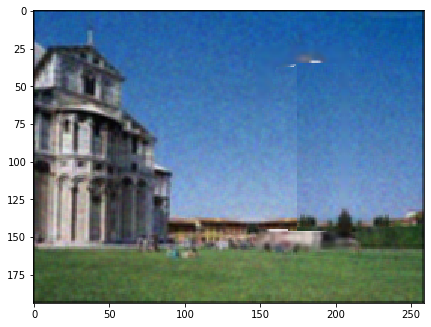

In [134]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(probando_imagen)

In [135]:
imagen_final = filtro_mediana_zona(probando_imagen, 25, 150, 170, 180)

n_iteraciones_mediana = 5
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 25, 150, 170, 180)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 5
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 25, 150, 170, 180)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))
    
n_iteraciones_media_final = 1
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 25, 150, 150, 210)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 0.125654935836792
En la iteracion 2 nos demoramos 0.12364935874938965
En la iteracion 3 nos demoramos 0.3011946678161621
En la iteracion 4 nos demoramos 0.17845869064331055
En la iteracion 5 nos demoramos 0.2985849380493164
En la iteracion 1 nos demoramos 0.23842191696166992
En la iteracion 2 nos demoramos 0.19248676300048828
En la iteracion 3 nos demoramos 0.19648218154907227
En la iteracion 4 nos demoramos 0.19248604774475098
En la iteracion 5 nos demoramos 0.42905402183532715
En la iteracion 1 nos demoramos 0.6932754516601562
En la iteracion 2 nos demoramos 0.7286932468414307
En la iteracion 3 nos demoramos 0.6912076473236084
En la iteracion 4 nos demoramos 0.7136638164520264
En la iteracion 5 nos demoramos 0.6391465663909912


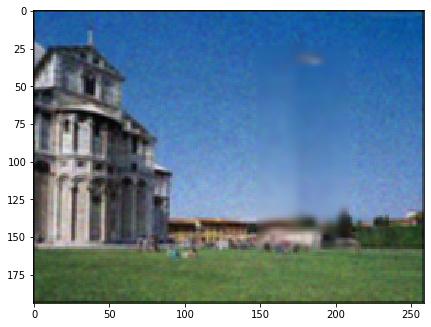

In [136]:
fig, ax = plt.subplots(figsize=(7,7))
plt.imshow(imagen_final)

In [137]:
fin_pisa = time.time()

In [138]:
print("El tiempo en imagen de pisa es: ", fin_pisa - principio_pisa)

El tiempo en imagen de pisa es:  109.18433713912964


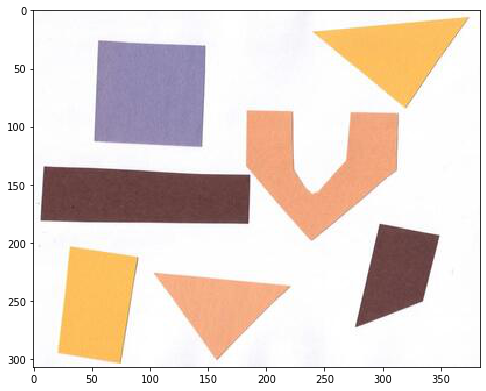

In [139]:
# CARGAR IMAGEN

fig, ax = plt.subplots(figsize=(8,8))
nombre = 'imagen_prueba.jpg'
imagen = plt.imread(nombre)
plt.imshow(imagen)

In [140]:
principio_figura = time.time()

In [141]:
gamma = 0.8
imagen_bajo_contraste = filtro_gamma(imagen, gamma)
porcentaje = 0.05
ruido = muestreo_normal(porcentaje, imagen_bajo_contraste)
imagen_con_ruido_bajo = transformacion_imagen(imagen_bajo_contraste, ruido)

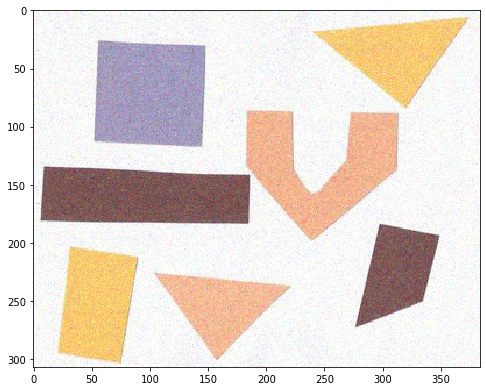

In [142]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_con_ruido_bajo)

In [143]:
filtro_media_imagen = filtro_media(imagen_con_ruido_bajo)
gamma = 1.4
imagen_trabajar = filtro_gamma(filtro_media_imagen, gamma)

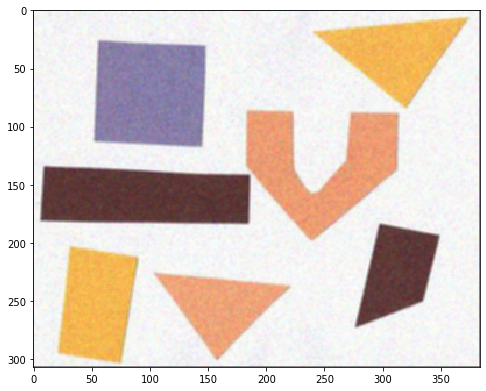

In [144]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_trabajar)

In [145]:
imagen_trabajar_rojo = sacar_imagen_canal(imagen_trabajar, 0)
imagen_trabajar_verde = sacar_imagen_canal(imagen_trabajar, 1)
imagen_trabajar_azul = sacar_imagen_canal(imagen_trabajar, 2)

f_rojo = np.fft.fft2(imagen_trabajar_rojo)
f_verde = np.fft.fft2(imagen_trabajar_verde)
f_azul = np.fft.fft2(imagen_trabajar_azul)

fshift_rojo = np.fft.fftshift(f_rojo)
fshift_verde = np.fft.fftshift(f_verde)
fshift_azul = np.fft.fftshift(f_azul)

magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo))
magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde))
magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul))

In [146]:
D_0 = 30

fshift_rojo_modificado = pasa_altos_gaussiano(fshift_rojo, D_0)
fshift_verde_modificado = pasa_altos_gaussiano(fshift_verde, D_0)
fshift_azul_modificado = pasa_altos_gaussiano(fshift_azul, D_0)

nueva_magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo_modificado))
nueva_magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde_modificado))
nueva_magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul_modificado))

In [147]:
f_ishift_rojo_modificado = np.fft.ifftshift(fshift_rojo_modificado)
img_back_rojo_modificado = np.fft.ifft2(f_ishift_rojo_modificado)
img_back_rojo_modificado = np.uint8(np.abs(img_back_rojo_modificado))

f_ishift_verde_modificado = np.fft.ifftshift(fshift_verde_modificado)
img_back_verde_modificado = np.fft.ifft2(f_ishift_verde_modificado)
img_back_verde_modificado = np.uint8(np.abs(img_back_verde_modificado))

f_ishift_azul_modificado = np.fft.ifftshift(fshift_azul_modificado)
img_back_azul_modificado = np.fft.ifft2(f_ishift_azul_modificado)
img_back_azul_modificado = np.uint8(np.abs(img_back_azul_modificado))

imagen_filtro_gaussiano = union_imagen(img_back_rojo_modificado, img_back_verde_modificado, img_back_azul_modificado)

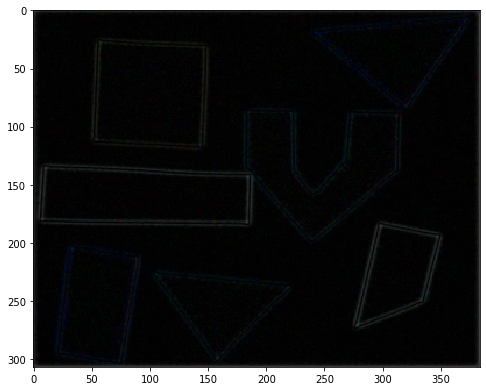

In [148]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_filtro_gaussiano)

In [149]:
tolerancia = 18
imagen_binaria = binarizacion_imagen(imagen_filtro_gaussiano, tolerancia)

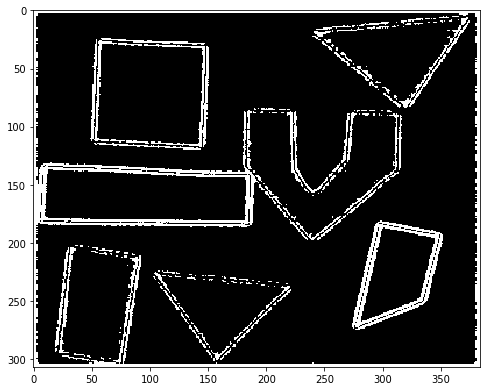

In [150]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_binaria)

In [151]:
iteraciones = 1
tolerancia = 18

for i in range(iteraciones):
    start = time.time()
    imagen_binaria = filtro_media(imagen_binaria)
    imagen_binaria = binarizacion_imagen(imagen_binaria, tolerancia)
    end = time.time()
    print("En la iteracion {0} se demoro {1}".format(i, end-start))

En la iteracion 0 se demoro 7.282570123672485


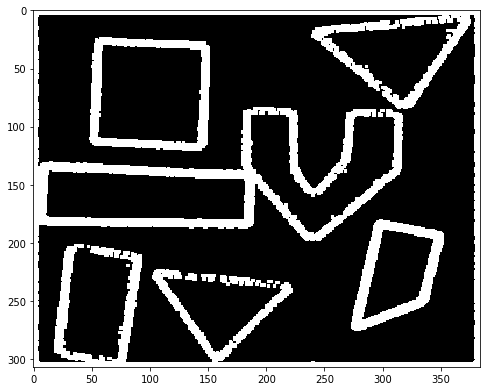

In [152]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_binaria)

In [153]:
identificacion = identificar_objeto(26, 120, 30, 150, imagen_binaria)
imagen_sacada = sacar_objeto(imagen_trabajar, identificacion)

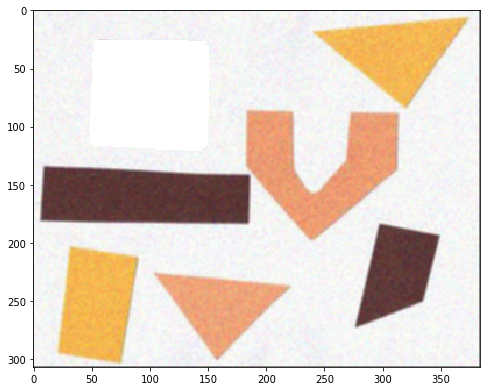

In [154]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_sacada)

In [155]:
imagen_sola = solo_objeto(imagen_trabajar, identificacion)

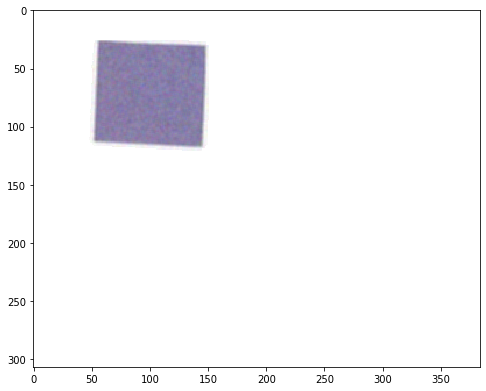

In [156]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_sola)

In [157]:
matriz_numeros = imagen_numerica(imagen_sacada)[0]
puntos = imagen_numerica(imagen_sacada)[1]  #Puntos son todos los puntos en blanco

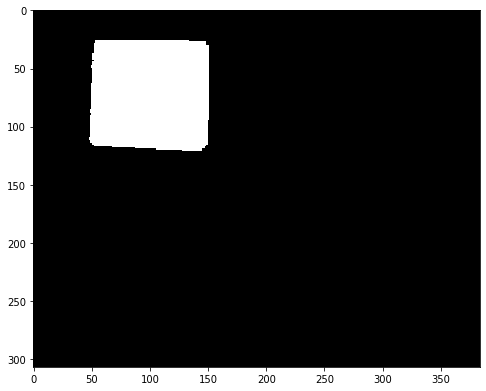

In [158]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(matriz_numeros)

In [159]:
# nuevos_puntos[0] son los puntos alrededor de la figura
nuevos_puntos  = sacar_puntos_candidatos(matriz_numeros, 3, puntos)

In [160]:
puntos_1 = nuevos_puntos[0]   #Puntos alrededor de la figura
puntos_2 = puntos   #Puntos dentro de la figura

In [161]:
start = time.time()

elementos_cercanos = elementos_mas_cercanos(puntos_1, puntos_2, 3)

end = time.time()

print(end-start)

0
1000
32.53437161445618


In [162]:
puntos_borde = []

for i in range(len(elementos_cercanos)):
    puntos_borde.append(elementos_cercanos[i][1])

In [163]:
puntos_espejo = []

for i in range(len(elementos_cercanos)):
   
    d_1 = elementos_cercanos[i][1][0] - elementos_cercanos[i][0][0]
    x_1 = d_1 + elementos_cercanos[i][1][0]
    
    d_2 = elementos_cercanos[i][1][1] - elementos_cercanos[i][0][1]
    x_2 = d_2 + elementos_cercanos[i][1][1]
    
    puntos_espejo.append([elementos_cercanos[i][0], [x_1, x_2]])

In [164]:
puntos_asignados = []

for i in range(len(puntos_espejo)):
    puntos_asignados.append(puntos_espejo[i][1])

In [165]:
puntos_asociados = []

for i in range(len(puntos_asignados)):
    lista = []
    for k in range(len(puntos_espejo)):
        if puntos_espejo[k][1] == puntos_asignados[i]:
            lista.append(puntos_espejo[k][0])
    puntos_asociados.append([puntos_asignados[i], lista])

In [166]:
elementos_gris = []

for i in range(len(elementos_cercanos)):
    elementos_gris.append(elementos_cercanos[i][0])

In [167]:
matriz_anillo = sacar_matriz_anillo(matriz_numeros, elementos_gris)

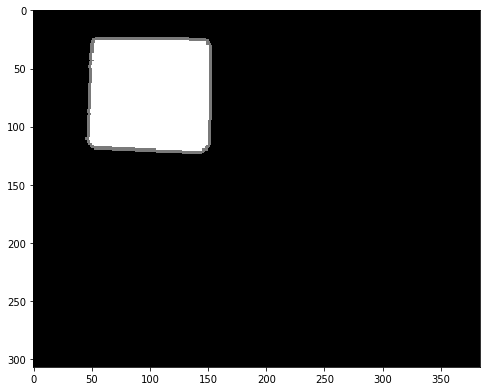

In [168]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(matriz_anillo)

In [169]:
imagen_mas_anillo = sacar_elementos_mas_anillo(imagen_trabajar, matriz_anillo)

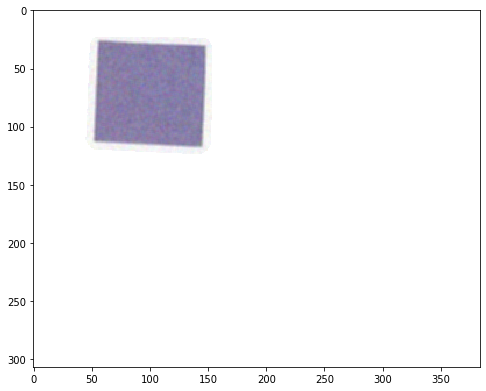

In [170]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_mas_anillo)

In [171]:
puntos_dentro = []

for i in range(len(puntos_asociados)):
    puntos_dentro.append(puntos_asociados[i][0])

In [172]:
output = imagen_espejo(imagen_sacada, puntos_asociados, puntos_dentro)
espejo = output[0]
puntos_ya_asignados = output[1]

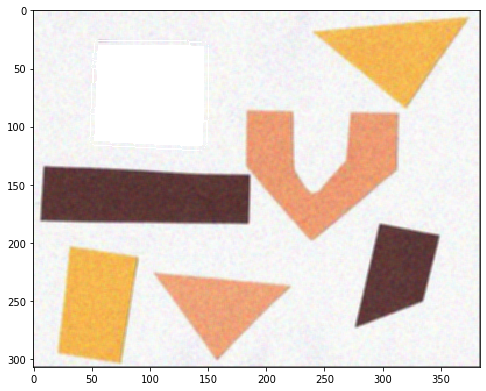

In [173]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(espejo)

In [174]:
anillo_interior = []
nuevo_radio = 10

for i in range(len(puntos_borde)):
    if i % 1000 == 0:
        print(i)
    for j in range(len(puntos)):
        distancia = ((puntos_borde[i][0] - puntos[j][0])**2 + (puntos_borde[i][1] - puntos[j][1])**2)**(1/2)
        if distancia <= nuevo_radio:
            if not(puntos[j] in anillo_interior):
                anillo_interior.append(puntos[j])

0
1000


In [175]:
puntos_aun_no_asignados = []

for i in range(len(anillo_interior)):
    if not(anillo_interior[i] in puntos_ya_asignados):
        puntos_aun_no_asignados.append(anillo_interior[i])

In [176]:
puntos_no_asignados_mas_cerca_1 = []
puntos_no_asignados_mas_cerca_2 = []

for i in range(len(puntos_aun_no_asignados)):
    lista_posibles = []
    lista_distancia = []
    for j in range(len(puntos_ya_asignados)):
        lista_posibles.append(puntos_ya_asignados[j])
        parte_1 = (puntos_ya_asignados[j][0] - puntos_aun_no_asignados[i][0])**2
        parte_2 = (puntos_ya_asignados[j][1] - puntos_aun_no_asignados[i][1])**2
        distancia = (parte_1 + parte_2)**(1/2)
        lista_distancia.append(distancia)
    minima_distancia = min(lista_distancia)
    indice = lista_distancia.index(minima_distancia)
    mas_cerca = lista_posibles[indice]
    puntos_no_asignados_mas_cerca_1.append(puntos_aun_no_asignados[i])
    puntos_no_asignados_mas_cerca_2.append(mas_cerca)

In [177]:
imagen_final = filtro_mediana_zona(espejo, 0, 150, 50, 175)

n_iteraciones_mediana = 3
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 0, 150, 50, 175)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 1
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 0, 150, 50, 175)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 2.7718679904937744
En la iteracion 2 nos demoramos 2.854860544204712
En la iteracion 3 nos demoramos 1.6508896350860596
En la iteracion 1 nos demoramos 1.9613244533538818


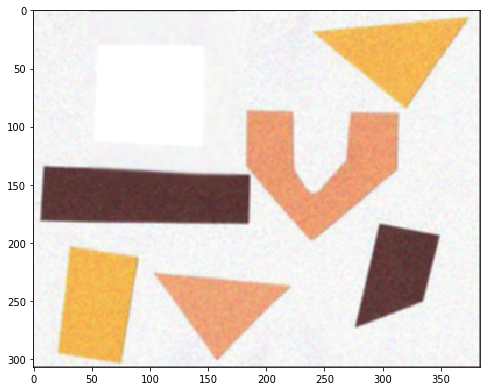

In [178]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(imagen_final)

In [179]:
puntos_residuales = []
tol = 440

nueva_imagen = []

for i in range(len(imagen_final)):
    filas = []
    for j in range(len(imagen_final[0])):
        if np.linalg.norm(imagen_final[i][j]) >= tol and 50 <= j <= 165 and 20 <= i <= 120:
            puntos_residuales.append([i, j])
            filas.append([255, 0, 0])
        else:
            filas.append(imagen_final[i][j])
    nueva_imagen.append(filas)

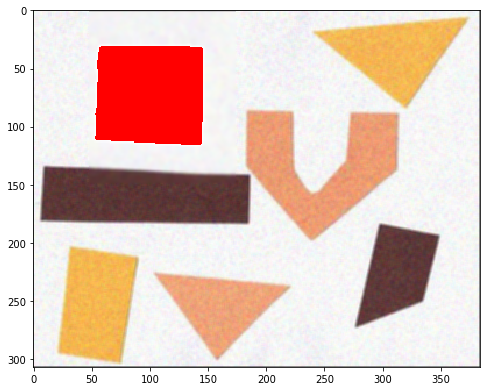

In [180]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(nueva_imagen)

In [181]:
# COMENZANDO A HACER INPAINTING

In [182]:
probando_imagen = []

for i in range(len(imagen_final)):
    lista = []
    for j in range(len(imagen_final[0])):
        lista.append(imagen_final[i][j])
    probando_imagen.append(lista)

In [183]:
# Separar los puntos residuales por nivel

primera_componente = []

for k in puntos_residuales:
    primera_componente.append(k[0])
    
primera_componente = set(primera_componente)

primera_componente = list(primera_componente)

puntos_residuales_nivel = []

for k in primera_componente:
    lista_nivel = []
    for i in puntos_residuales:
        if i[0] == k:
            lista_nivel.append(i[1])
    puntos_residuales_nivel.append(lista_nivel)
    
intervalos_nivel = []

for k in puntos_residuales_nivel:
    intervalos_nivel.append([min(k), max(k)])
    
niveles_maximo = []
niveles_minimo = []

for h in intervalos_nivel:
    niveles_maximo.append(h[1])
    niveles_minimo.append(h[0])

In [184]:
# Redifinimos puntos residuales

numero = 10
nuevos_puntos_residuales = []

for i in range(len(primera_componente)):
    for j in range(intervalos_nivel[i][0] - numero, 1 + intervalos_nivel[i][1] + numero + 1):
        nuevos_puntos_residuales.append([primera_componente[i], j])

puntos_residuales = nuevos_puntos_residuales

In [185]:
# Separar los puntos residuales por nivel

primera_componente = []

for k in puntos_residuales:
    primera_componente.append(k[0])
    
primera_componente = set(primera_componente)

primera_componente = list(primera_componente)

puntos_residuales_nivel = []

for k in primera_componente:
    lista_nivel = []
    for i in puntos_residuales:
        if i[0] == k:
            lista_nivel.append(i[1])
    puntos_residuales_nivel.append(lista_nivel)
    
intervalos_nivel = []

for k in puntos_residuales_nivel:
    intervalos_nivel.append([min(k), max(k)])
    
niveles_maximo = []
niveles_minimo = []

for h in intervalos_nivel:
    niveles_maximo.append(h[1])
    niveles_minimo.append(h[0])

In [186]:
minimo = 45
maximo = 160
limite_1 = 65
limite_2 = 140

In [187]:
for k in puntos_residuales:
    indice = primera_componente.index(k[0])
    if limite_2 <= k[1] <= maximo+numero:
        distancia = maximo - k[1]
        nuevo_indice = distancia + maximo
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]
    elif minimo <= k[1] <= limite_1:
        distancia = k[1] - minimo
        nuevo_indice = minimo - distancia
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]

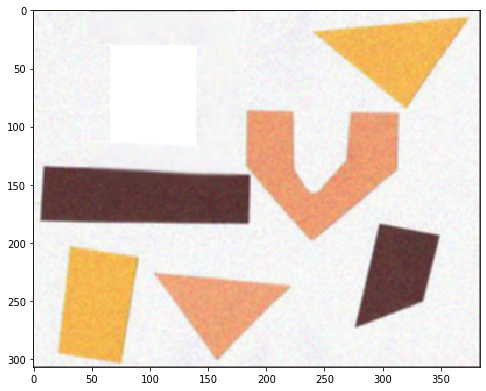

In [188]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(probando_imagen)

In [189]:
tol = 435
nueva_imagen = []
pixeles_capturados = []

for i in range(len(probando_imagen)):
    lista_imagen = []
    for j in range(len(probando_imagen[0])):
        if np.linalg.norm(probando_imagen[i][j]) >= tol and 60 <= j <= 150 and 25 <= i <= 125:
            lista_imagen.append([255, 0, 0])
            pixeles_capturados.append([i, j])
        else:
            lista_imagen.append(probando_imagen[i][j])
    nueva_imagen.append(lista_imagen)

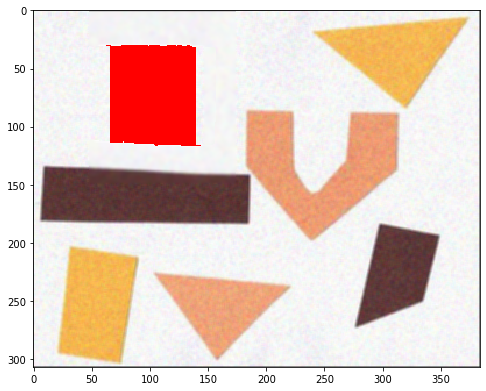

In [190]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(nueva_imagen)

In [191]:
primeras_coordenadas = []

for k in pixeles_capturados:
    primeras_coordenadas.append(k[0])

primeras_coordenadas = set(primeras_coordenadas)
primeras_coordenadas = list(primeras_coordenadas)

segunda_coordenada = []

for i in range(len(primeras_coordenadas)):
    lista = []
    for k in pixeles_capturados:
        if k[0] == primeras_coordenadas[i]:
            lista.append(k[1])
    segunda_coordenada.append([min(lista), max(lista)])

In [192]:
numero = 25

for i in range(30, 125):
    for j in range(60, 140):
        probando_imagen[i][j] = probando_imagen[i][j-numero]
        

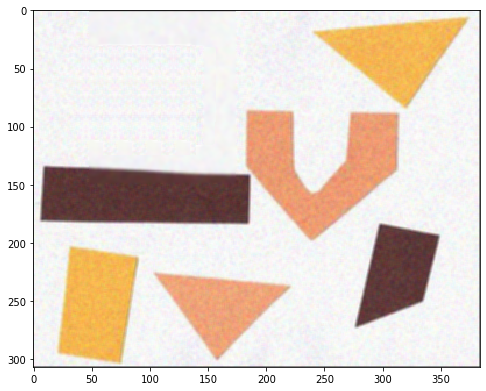

In [193]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(probando_imagen)

In [194]:
imagen_final = filtro_mediana_zona(probando_imagen, 0, 150, 50, 175)

n_iteraciones_mediana = 3
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 0, 150, 50, 175)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 1
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 0, 150, 50, 175)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 2.8626885414123535
En la iteracion 2 nos demoramos 1.9484257698059082
En la iteracion 3 nos demoramos 2.8544418811798096
En la iteracion 1 nos demoramos 1.5307605266571045


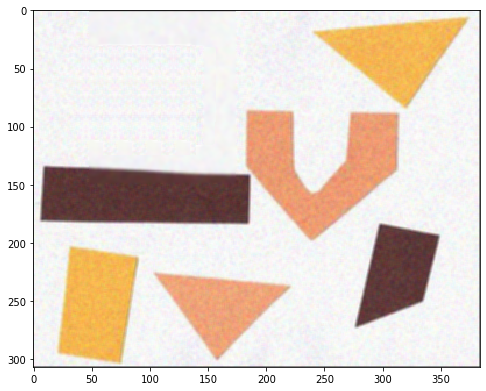

In [195]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(probando_imagen)

In [196]:
fin_figura = time.time()

In [197]:
print("El tiempo en imagen de figura es: ", fin_figura - principio_figura)

El tiempo en imagen de figura es:  162.90208888053894


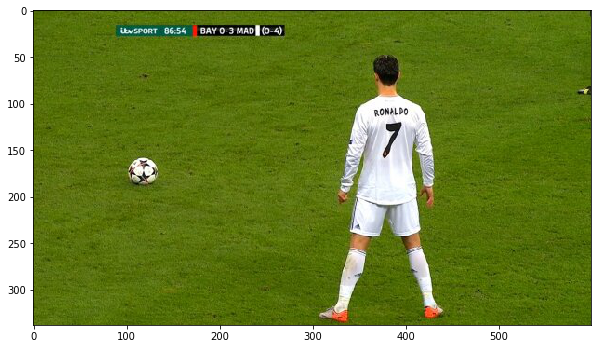

In [198]:
# CARGAR IMAGEN

fig, ax = plt.subplots(figsize=(10,10))
nombre = 'cristiano.jpg'
imagen = plt.imread(nombre)
plt.imshow(imagen)

In [199]:
principio_cristiano = time.time()

In [200]:
gamma = 0.8
imagen_bajo_contraste = filtro_gamma(imagen, gamma)
porcentaje = 0.05
ruido = muestreo_normal(porcentaje, imagen_bajo_contraste)
imagen_con_ruido_bajo = transformacion_imagen(imagen_bajo_contraste, ruido)

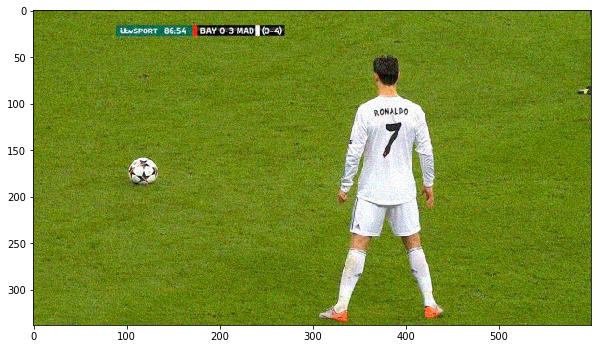

In [201]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_con_ruido_bajo)

In [202]:
filtro_media_imagen = filtro_media(imagen_con_ruido_bajo)
gamma = 1.4
imagen_trabajar = filtro_gamma(filtro_media_imagen, gamma)

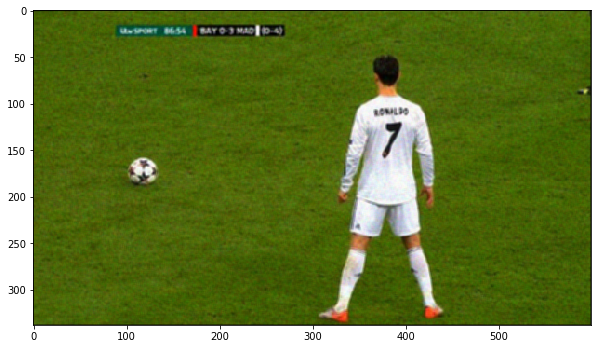

In [203]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_trabajar)

In [204]:
imagen_trabajar_rojo = sacar_imagen_canal(imagen_trabajar, 0)
imagen_trabajar_verde = sacar_imagen_canal(imagen_trabajar, 1)
imagen_trabajar_azul = sacar_imagen_canal(imagen_trabajar, 2)

f_rojo = np.fft.fft2(imagen_trabajar_rojo)
f_verde = np.fft.fft2(imagen_trabajar_verde)
f_azul = np.fft.fft2(imagen_trabajar_azul)

fshift_rojo = np.fft.fftshift(f_rojo)
fshift_verde = np.fft.fftshift(f_verde)
fshift_azul = np.fft.fftshift(f_azul)

magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo))
magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde))
magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul))

In [205]:
D_0 = 30

fshift_rojo_modificado = pasa_altos_gaussiano(fshift_rojo, D_0)
fshift_verde_modificado = pasa_altos_gaussiano(fshift_verde, D_0)
fshift_azul_modificado = pasa_altos_gaussiano(fshift_azul, D_0)

nueva_magnitud_espectro_rojo = 20*np.log(np.abs(fshift_rojo_modificado))
nueva_magnitud_espectro_verde = 20*np.log(np.abs(fshift_verde_modificado))
nueva_magnitud_espectro_azul = 20*np.log(np.abs(fshift_azul_modificado))

In [206]:
f_ishift_rojo_modificado = np.fft.ifftshift(fshift_rojo_modificado)
img_back_rojo_modificado = np.fft.ifft2(f_ishift_rojo_modificado)
img_back_rojo_modificado = np.uint8(np.abs(img_back_rojo_modificado))

f_ishift_verde_modificado = np.fft.ifftshift(fshift_verde_modificado)
img_back_verde_modificado = np.fft.ifft2(f_ishift_verde_modificado)
img_back_verde_modificado = np.uint8(np.abs(img_back_verde_modificado))

f_ishift_azul_modificado = np.fft.ifftshift(fshift_azul_modificado)
img_back_azul_modificado = np.fft.ifft2(f_ishift_azul_modificado)
img_back_azul_modificado = np.uint8(np.abs(img_back_azul_modificado))

imagen_filtro_gaussiano = union_imagen(img_back_rojo_modificado, img_back_verde_modificado, img_back_azul_modificado)

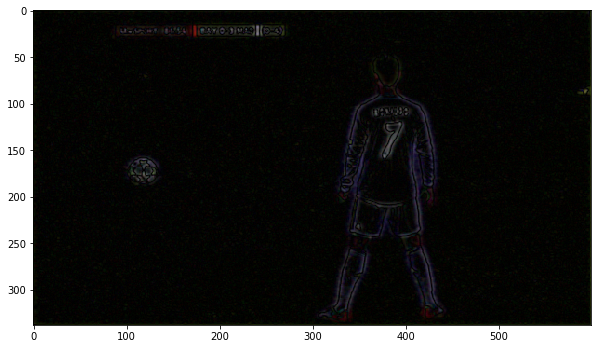

In [207]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_filtro_gaussiano)

In [208]:
tolerancia = 18
imagen_binaria = binarizacion_imagen(imagen_filtro_gaussiano, tolerancia)

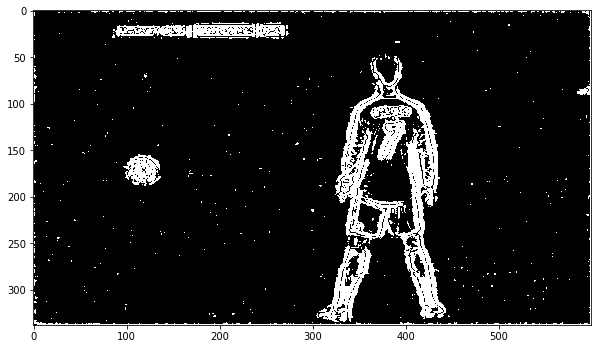

In [209]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_binaria)

In [210]:
iteraciones = 1
tolerancia = 18

for i in range(iteraciones):
    start = time.time()
    imagen_binaria = filtro_media(imagen_binaria)
    imagen_binaria = binarizacion_imagen(imagen_binaria, tolerancia)
    end = time.time()
    print("En la iteracion {0} se demoro {1}".format(i, end-start))

En la iteracion 0 se demoro 13.686301946640015


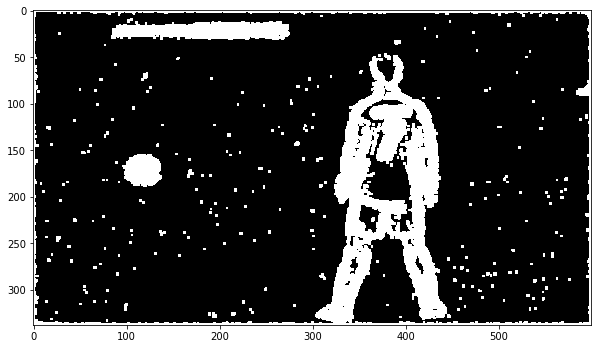

In [211]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_binaria)

In [212]:
iteraciones_mediana = 20

for i in range(iteraciones_mediana):
    start = time.time()
    imagen_binaria = filtro_mediana(imagen_binaria)
    end = time.time()
    print("Iteración: ", i)
    print("Tiempo: ", end-start)

Iteración:  0
Tiempo:  27.02657413482666
Iteración:  1
Tiempo:  24.07354760169983
Iteración:  2
Tiempo:  21.172006607055664
Iteración:  3
Tiempo:  21.654386281967163
Iteración:  4
Tiempo:  22.087352991104126
Iteración:  5
Tiempo:  22.936021327972412
Iteración:  6
Tiempo:  24.281999349594116
Iteración:  7
Tiempo:  23.148456811904907
Iteración:  8
Tiempo:  23.475026607513428
Iteración:  9
Tiempo:  24.063695669174194
Iteración:  10
Tiempo:  23.381383419036865
Iteración:  11
Tiempo:  24.517932176589966
Iteración:  12
Tiempo:  23.78315830230713
Iteración:  13
Tiempo:  21.71883487701416
Iteración:  14
Tiempo:  25.113905429840088
Iteración:  15
Tiempo:  24.086743116378784
Iteración:  16
Tiempo:  23.878525257110596
Iteración:  17
Tiempo:  23.22809886932373
Iteración:  18
Tiempo:  22.39650321006775
Iteración:  19
Tiempo:  23.213765382766724


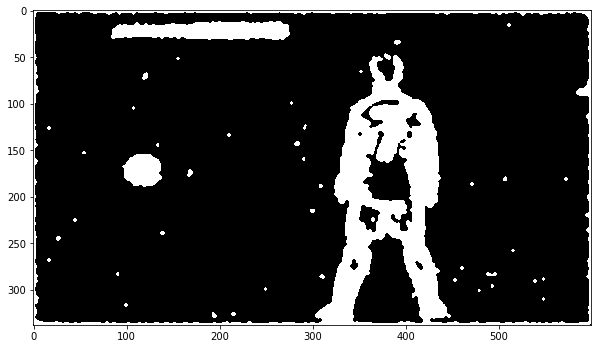

In [213]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_binaria)

In [214]:
identificacion = identificar_objeto(155, 186, 75, 150, imagen_binaria)
imagen_sacada = sacar_objeto(imagen_trabajar, identificacion)

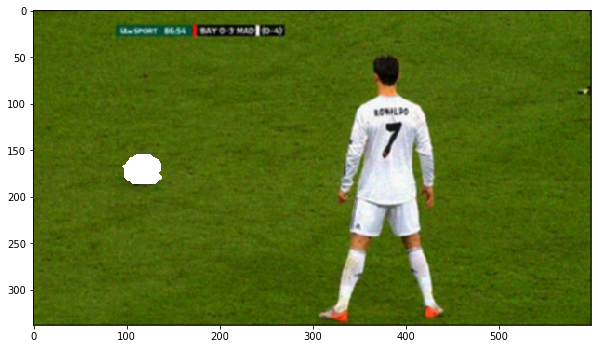

In [215]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_sacada)

In [216]:
imagen_sola = solo_objeto(imagen_trabajar, identificacion)

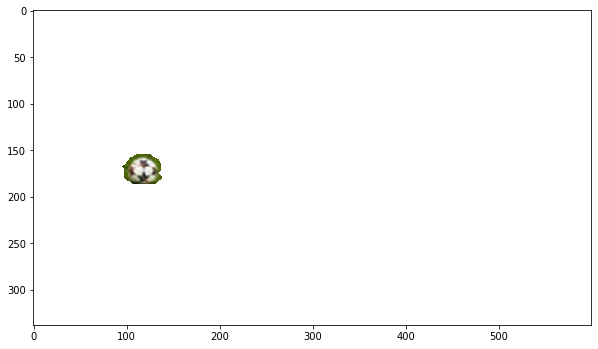

In [217]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_sola)

In [218]:
matriz_numeros = imagen_numerica(imagen_sacada)[0]
puntos = imagen_numerica(imagen_sacada)[1]  #Puntos son todos los puntos en blanco

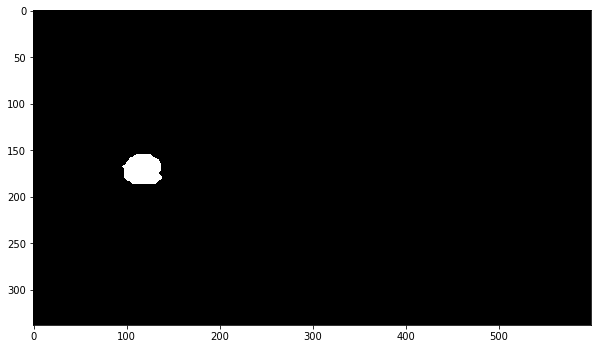

In [219]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(matriz_numeros)

In [220]:
# nuevos_puntos[0] son los puntos alrededor de la figura
nuevos_puntos  = sacar_puntos_candidatos(matriz_numeros, 5, puntos)

In [221]:
puntos_1 = nuevos_puntos[0]   #Puntos alrededor de la figura
puntos_2 = puntos   #Puntos dentro de la figura

In [222]:
start = time.time()

elementos_cercanos = elementos_mas_cercanos(puntos_1, puntos_2, 5)

end = time.time()

print(end-start)

0
1000
1.2852706909179688


In [223]:
puntos_borde = []

for i in range(len(elementos_cercanos)):
    puntos_borde.append(elementos_cercanos[i][1])

In [224]:
puntos_espejo = []

for i in range(len(elementos_cercanos)):
   
    d_1 = elementos_cercanos[i][1][0] - elementos_cercanos[i][0][0]
    x_1 = d_1 + elementos_cercanos[i][1][0]
    
    d_2 = elementos_cercanos[i][1][1] - elementos_cercanos[i][0][1]
    x_2 = d_2 + elementos_cercanos[i][1][1]
    
    puntos_espejo.append([elementos_cercanos[i][0], [x_1, x_2]])

In [225]:
puntos_asignados = []

for i in range(len(puntos_espejo)):
    puntos_asignados.append(puntos_espejo[i][1])

In [226]:
puntos_asociados = []

for i in range(len(puntos_asignados)):
    lista = []
    for k in range(len(puntos_espejo)):
        if puntos_espejo[k][1] == puntos_asignados[i]:
            lista.append(puntos_espejo[k][0])
    puntos_asociados.append([puntos_asignados[i], lista])

In [227]:
elementos_gris = []

for i in range(len(elementos_cercanos)):
    elementos_gris.append(elementos_cercanos[i][0])

In [228]:
matriz_anillo = sacar_matriz_anillo(matriz_numeros, elementos_gris)

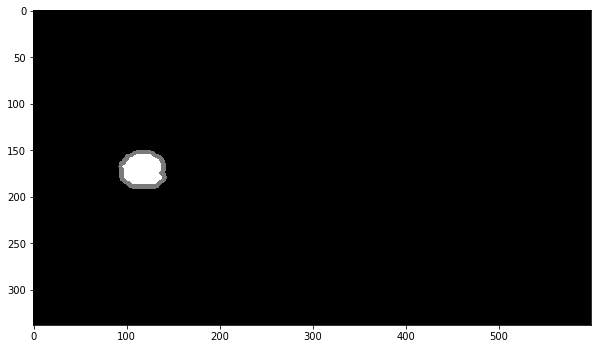

In [229]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(matriz_anillo)

In [230]:
imagen_mas_anillo = sacar_elementos_mas_anillo(imagen_trabajar, matriz_anillo)

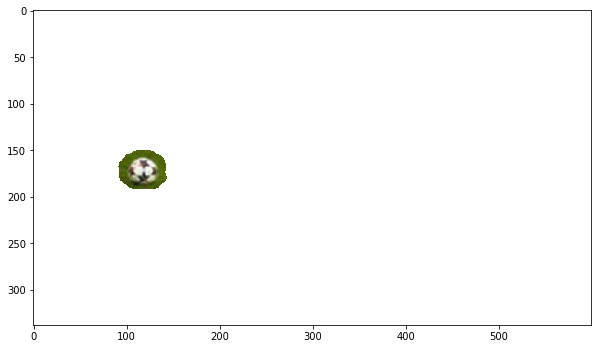

In [231]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_mas_anillo)

In [232]:
puntos_dentro = []

for i in range(len(puntos_asociados)):
    puntos_dentro.append(puntos_asociados[i][0])

In [233]:
output = imagen_espejo(imagen_sacada, puntos_asociados, puntos_dentro)
espejo = output[0]
puntos_ya_asignados = output[1]

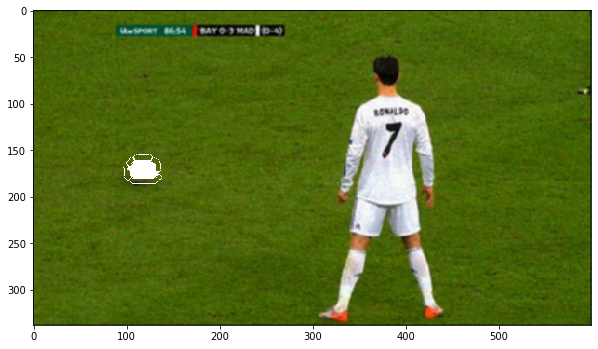

In [234]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(espejo)

In [235]:
anillo_interior = []
nuevo_radio = 10

for i in range(len(puntos_borde)):
    if i % 1000 == 0:
        print(i)
    for j in range(len(puntos)):
        distancia = ((puntos_borde[i][0] - puntos[j][0])**2 + (puntos_borde[i][1] - puntos[j][1])**2)**(1/2)
        if distancia <= nuevo_radio:
            if not(puntos[j] in anillo_interior):
                anillo_interior.append(puntos[j])

0


In [236]:
puntos_aun_no_asignados = []

for i in range(len(anillo_interior)):
    if not(anillo_interior[i] in puntos_ya_asignados):
        puntos_aun_no_asignados.append(anillo_interior[i])

In [237]:
puntos_no_asignados_mas_cerca_1 = []
puntos_no_asignados_mas_cerca_2 = []

for i in range(len(puntos_aun_no_asignados)):
    lista_posibles = []
    lista_distancia = []
    for j in range(len(puntos_ya_asignados)):
        lista_posibles.append(puntos_ya_asignados[j])
        parte_1 = (puntos_ya_asignados[j][0] - puntos_aun_no_asignados[i][0])**2
        parte_2 = (puntos_ya_asignados[j][1] - puntos_aun_no_asignados[i][1])**2
        distancia = (parte_1 + parte_2)**(1/2)
        lista_distancia.append(distancia)
    minima_distancia = min(lista_distancia)
    indice = lista_distancia.index(minima_distancia)
    mas_cerca = lista_posibles[indice]
    puntos_no_asignados_mas_cerca_1.append(puntos_aun_no_asignados[i])
    puntos_no_asignados_mas_cerca_2.append(mas_cerca)

In [238]:
resultado_final = espejo_final(espejo, puntos_no_asignados_mas_cerca_1, puntos_no_asignados_mas_cerca_2)

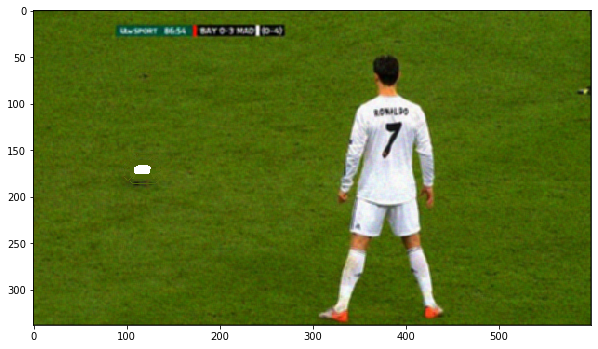

In [239]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(resultado_final)

In [240]:
imagen_final = filtro_mediana_zona(resultado_final, 150, 200, 90, 140)

n_iteraciones_mediana = 1
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 150, 200, 90, 140)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 1
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 150, 200, 90, 140)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 0.8321475982666016
En la iteracion 1 nos demoramos 1.0346899032592773


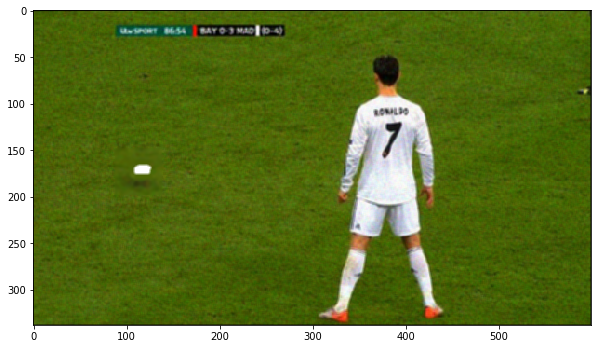

In [241]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_final)

In [242]:
puntos_residuales = []

for k in puntos:
    if not(k in anillo_interior):
        puntos_residuales.append(k)

In [243]:
start = time.time()

imagen_def = imagen_definitiva(imagen_final, puntos_residuales)

end = time.time()

print(end-start)

1.469071626663208


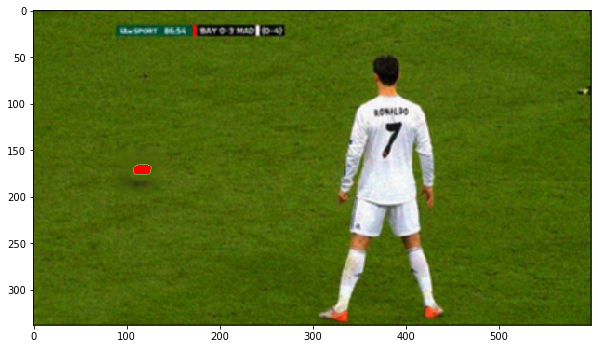

In [244]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_def)

In [245]:
##### EMPEZANDO A HACER INPAINTING

probando_imagen = []

for i in range(len(imagen_final)):
    lista = []
    for j in range(len(imagen_final[0])):
        lista.append(imagen_final[i][j])
    probando_imagen.append(lista)

In [246]:
# Separar los puntos residuales por nivel

primera_componente = []

for k in puntos_residuales:
    primera_componente.append(k[0])
    
primera_componente = set(primera_componente)

primera_componente = list(primera_componente)

puntos_residuales_nivel = []

for k in primera_componente:
    lista_nivel = []
    for i in puntos_residuales:
        if i[0] == k:
            lista_nivel.append(i[1])
    puntos_residuales_nivel.append(lista_nivel)
    
intervalos_nivel = []

for k in puntos_residuales_nivel:
    intervalos_nivel.append([min(k), max(k)])
    
niveles_maximo = []
niveles_minimo = []

for h in intervalos_nivel:
    niveles_maximo.append(h[1])
    niveles_minimo.append(h[0])

In [247]:
limite_1 = 110
limite_2 = 110

minimo = min(niveles_minimo)
maximo = max(niveles_maximo)

In [248]:
for k in puntos_residuales:
    indice = primera_componente.index(k[0])
    if limite_2 <= k[1] <= maximo:
        distancia = maximo - k[1]
        nuevo_indice = distancia + maximo
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]
    elif minimo <= k[1] <= limite_1:
        distancia = k[1] - minimo
        nuevo_indice = minimo - distancia
        probando_imagen[k[0]][k[1]] = imagen_final[k[0]][nuevo_indice]

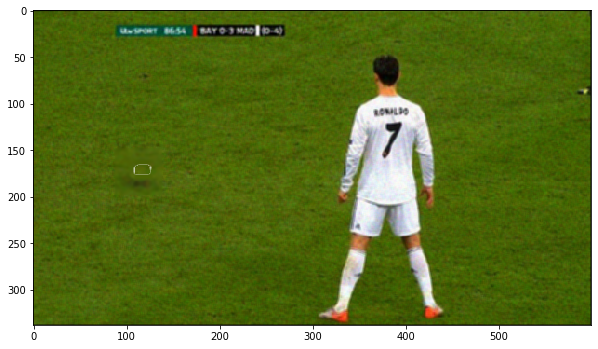

In [249]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(probando_imagen)

In [250]:
imagen_final = filtro_mediana_zona(probando_imagen, 150, 200, 90, 140)

n_iteraciones_mediana = 2
for i in range(n_iteraciones_mediana):
    start = time.time()
    imagen_final = filtro_mediana_zona(imagen_final, 150, 200, 90, 140)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(i+1, end-start))

n_iteraciones_media = 0
for j in range(n_iteraciones_media):
    start = time.time()
    imagen_final = filtro_media_zona(imagen_final, 150, 200, 90, 140)
    end = time.time()
    print("En la iteracion {0} nos demoramos {1}".format(j+1, end-start))

En la iteracion 1 nos demoramos 0.4956364631652832
En la iteracion 2 nos demoramos 1.32694673538208


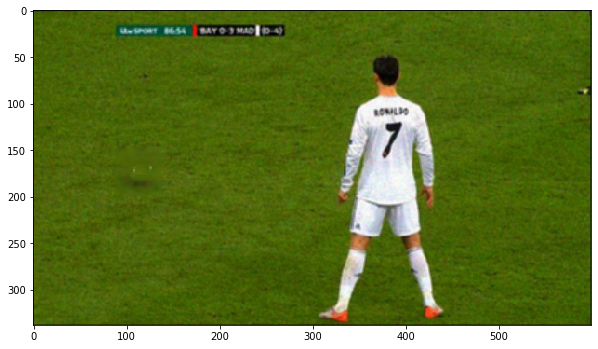

In [251]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(imagen_final)

In [252]:
fin_cristiano = time.time()

In [253]:
print("El tiempo en imagen de cristiano es: ", fin_cristiano - principio_cristiano)

El tiempo en imagen de cristiano es:  565.7045547962189
